ResNet FedProx

**Imports & Drive Mount**

In [ ]:
#!pip install monai nibabel torch torchvision torchmetrics -q

In [ ]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from monai.transforms import LoadImaged, EnsureChannelFirstd, Compose, ResizeWithPadOrCropd, NormalizeIntensityd, Orientationd
from monai.networks.nets import SegResNet
from monai.losses import DiceLoss
from monai.metrics import DiceMetric, HausdorffDistanceMetric
from glob import glob
import copy
#from google.colab import drive

import random
import nibabel as nib
import numpy as np

from torch.utils.tensorboard import SummaryWriter
import matplotlib.pyplot as plt
from tqdm import tqdm
import warnings
import shutil

In [ ]:
#supress warnings for cleaner console output
warnings.filterwarnings("ignore", category=FutureWarning, module="monai")

In [ ]:
# Mount Google Drive
# from google.colab import drive
# drive.mount('/content/drive')

data_dir = "D:/F25-156/ISLES22_split"
print(data_dir)

D:/F25-156/ISLES22_split


In [ ]:
#save checkpoint and tensorboard logs in drive
checkpoint_dir = "D:/F25-156/ResNet/Federated_ResNet3D_checkpoints"
log_dir = "D:/F25-156/ResNet/Federated_ResNet3D_logs"

# Remove old directories if they exist
if os.path.exists(checkpoint_dir):
    shutil.rmtree(checkpoint_dir)

if os.path.exists(log_dir):
    shutil.rmtree(log_dir)

# Recreate directories
os.makedirs(checkpoint_dir)
os.makedirs(log_dir)

writer = SummaryWriter(log_dir=log_dir)
print(f"Checkpoints will be saved to: {checkpoint_dir}")
print(f"TensorBoard logs will be saved to: {log_dir}")

%load_ext tensorboard
%tensorboard --logdir "D:/F25-156/ResNet/Federated_ResNet3D_logs"

Checkpoints will be saved to: D:/F25-156/ResNet/Federated_ResNet3D_checkpoints
TensorBoard logs will be saved to: D:/F25-156/ResNet/Federated_ResNet3D_logs


In [ ]:
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(42)

**MONAI Preprocessing Transforms**

In [ ]:
# Target shape for all volumes
target_shape = (96,96,96)

sample_transform = Compose([
    LoadImaged(keys=["image"]),
    EnsureChannelFirstd(keys=["image"]),
    Orientationd(keys=["image"], axcodes="RAS"),
    ResizeWithPadOrCropd(keys=["image"], spatial_size=target_shape),
    NormalizeIntensityd(keys=["image"], nonzero=True)
])

mask_transform = Compose([
    LoadImaged(keys=["image"]),
    EnsureChannelFirstd(keys=["image"]),
    Orientationd(keys=["image"], axcodes="RAS"),
    ResizeWithPadOrCropd(
        keys=["image"],
        spatial_size=target_shape,
        mode="constant"
    )
])


**Dataset Class**

In [ ]:
def load_dwi_mask_pairs(base_path):
    dwi_files = sorted(glob(os.path.join(base_path, "DWI", "*.nii*")))
    mask_files = sorted(glob(os.path.join(base_path, "masks", "*.nii*")))
    assert len(dwi_files) == len(mask_files), f"Mismatch in {base_path}"
    return dwi_files, mask_files


In [ ]:
class ISLESDataset(Dataset):
    def __init__(self, dwi_files, mask_files,
                 image_transform=None,
                 mask_transform=None):

        assert len(dwi_files) == len(mask_files)

        self.dwi_files = dwi_files
        self.mask_files = mask_files
        self.image_transform = image_transform
        self.mask_transform = mask_transform

    def __len__(self):
        return len(self.dwi_files)

    def __getitem__(self, idx):

        image_dict = {"image": self.dwi_files[idx]}
        mask_dict = {"image": self.mask_files[idx]}

        if self.image_transform:
            image_dict = self.image_transform(image_dict)

        if self.mask_transform:
            mask_dict = self.mask_transform(mask_dict)

        image = image_dict["image"].float()
        mask = mask_dict["image"].long()

        return {"image": image, "mask": mask}

**Load Files and Apply MONAI Transforms**

**Split into “Clients” (Federated Simulation)**


Client 0 - Raw Samples:
Sample 40 | Image shape: (128, 128, 25) | Mask shape: (128, 128, 25) | Mask Values: tensor([0.0000, 1.0000], dtype=torch.float64)


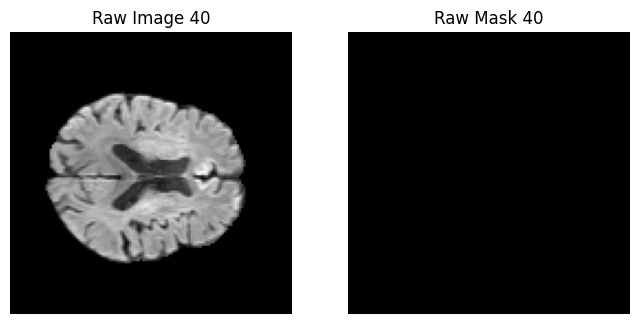

Sample 7 | Image shape: (112, 112, 73) | Mask shape: (112, 112, 73) | Mask Values: tensor([0., 1.], dtype=torch.float64)


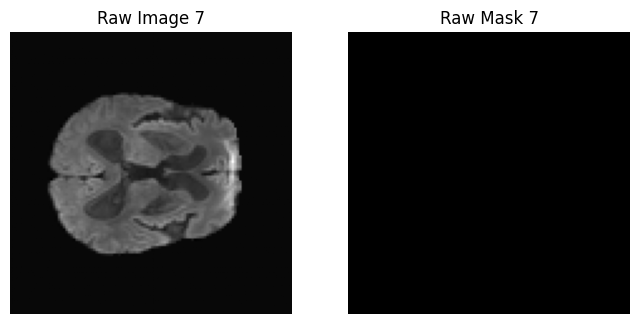

Client 0 - Preprocessed Samples:
Sample 40 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


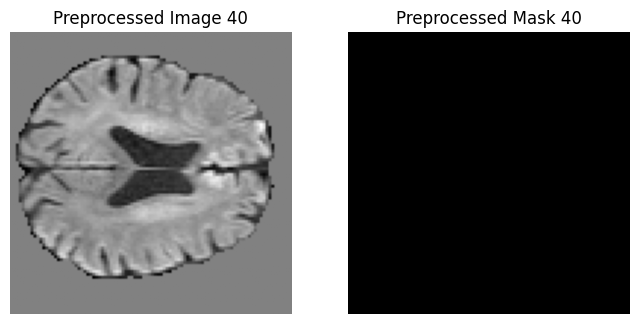

Sample 7 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


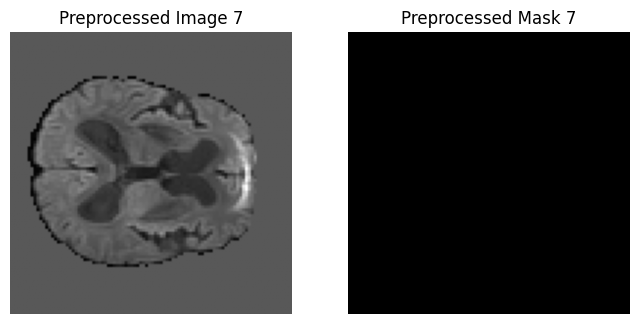

Client 0 samples: 50

Client 1 - Raw Samples:
Sample 1 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72) | Mask Values: tensor([0., 1.], dtype=torch.float64)


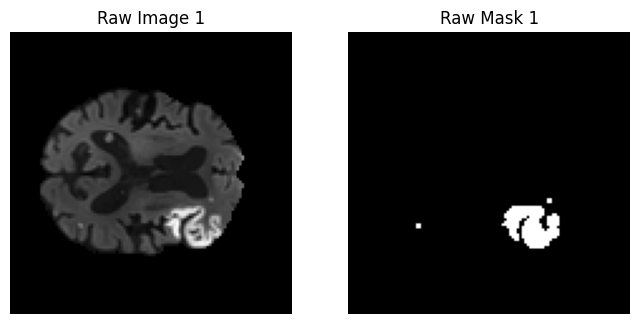

Sample 47 | Image shape: (192, 192, 30) | Mask shape: (192, 192, 30) | Mask Values: tensor([0.0000, 1.0000], dtype=torch.float64)


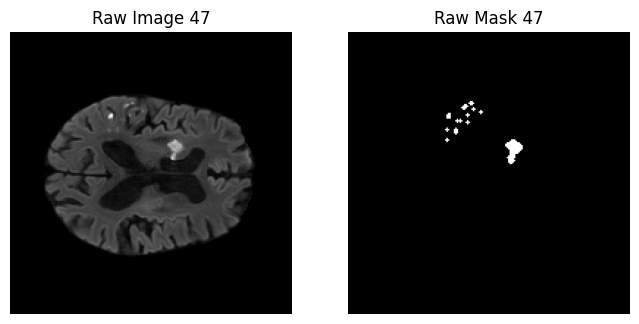

Client 1 - Preprocessed Samples:
Sample 1 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


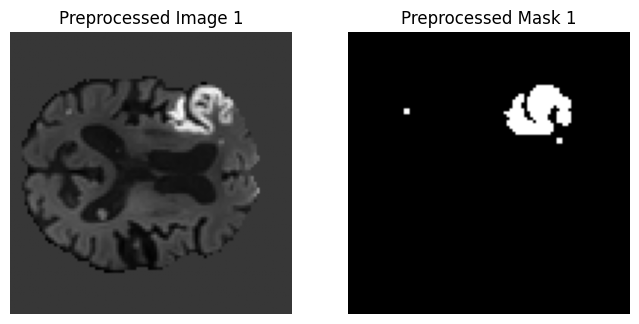

Sample 47 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


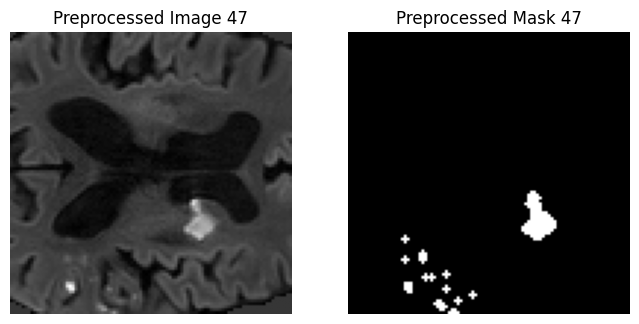

Client 1 samples: 50

Client 2 - Raw Samples:
Sample 17 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72) | Mask Values: tensor([0., 1.], dtype=torch.float64)


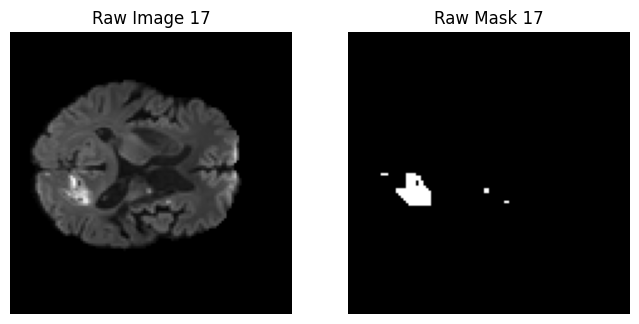

Sample 15 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72) | Mask Values: tensor([0., 1.], dtype=torch.float64)


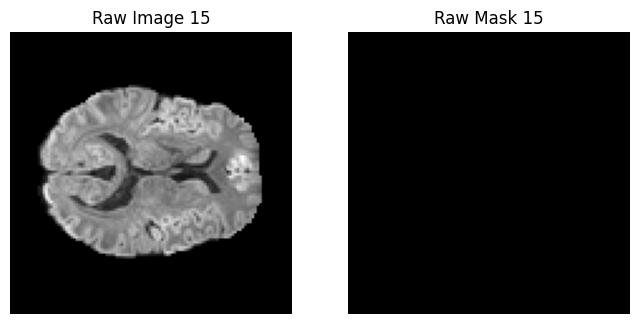

Client 2 - Preprocessed Samples:
Sample 17 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


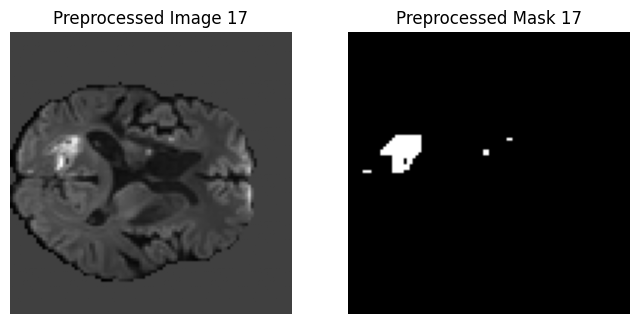

Sample 15 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


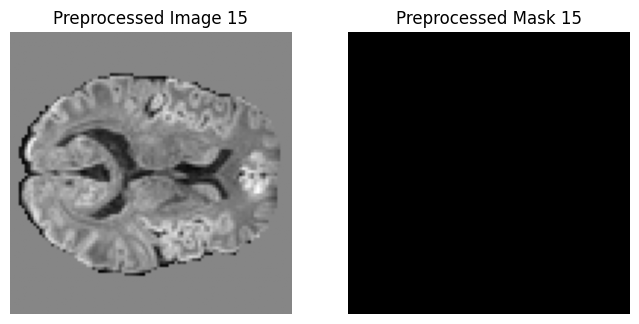

Client 2 samples: 50


In [ ]:
num_clients = 3
client_datasets = []

for i in range(num_clients):
    client_path = os.path.join(data_dir, "train", f"client_{i}")
    dwi_files, mask_files = load_dwi_mask_pairs(client_path)

    # -----------------------------
    # Visualize 2 random raw samples
    # -----------------------------
    sample_indices = random.sample(range(len(dwi_files)), k=2)
    print(f"\nClient {i} - Raw Samples:")
    for idx in sample_indices:
        img = nib.load(dwi_files[idx]).get_fdata()
        mask = nib.load(mask_files[idx]).get_fdata()
        mask_tensor = torch.from_numpy(mask)

        print(f"Sample {idx} | Image shape: {img.shape} | Mask shape: {mask.shape} | Mask Values: {torch.unique(mask_tensor)}")  #make sure mask only contains 0 and 1

        mid_slice = img.shape[2] // 2  # middle slice
        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img[:,:,mid_slice], cmap="gray")
        plt.title(f"Raw Image {idx}")
        plt.axis("off")
        plt.subplot(1,2,2)
        plt.imshow(mask[:,:,mid_slice], cmap="gray")
        plt.title(f"Raw Mask {idx}")
        plt.axis("off")
        plt.show()

    # -----------------------------
    # Create preprocessed dataset
    # -----------------------------
    ds = ISLESDataset(
        dwi_files=dwi_files,
        mask_files=mask_files,
        image_transform=sample_transform,
        mask_transform=mask_transform
    )
    client_datasets.append(ds)

    # -----------------------------
    # Visualize 2 random preprocessed samples
    # -----------------------------
    print(f"Client {i} - Preprocessed Samples:")
    for idx in sample_indices:
        sample = ds[idx]
        img_proc = sample["image"][0].numpy()  # remove channel
        mask_proc = sample["mask"][0].numpy()
        print(f"Sample {idx} | Image shape: {img_proc.shape} | Mask shape: {mask_proc.shape}  | Mask Values: {torch.unique(sample['mask'])}")

        mid_slice = img_proc.shape[2] // 2
        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img_proc[:,:,mid_slice], cmap="gray")
        plt.title(f"Preprocessed Image {idx}")
        plt.axis("off")
        plt.subplot(1,2,2)
        plt.imshow(mask_proc[:,:,mid_slice], cmap="gray")
        plt.title(f"Preprocessed Mask {idx}")
        plt.axis("off")
        plt.show()

    print(f"Client {i} samples: {len(ds)}")

**Validation Set**

In [ ]:
val_dwi, val_masks = load_dwi_mask_pairs(os.path.join(data_dir, "val"))

val_dataset = ISLESDataset(
    dwi_files=val_dwi,
    mask_files=val_masks,
    image_transform=sample_transform,
    mask_transform=mask_transform
)

val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)

print("Validation samples:", len(val_dataset))

Validation samples: 50


ResNet

In [ ]:
print("CUDA version:", torch.version.cuda)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

CUDA version: 12.1
CUDA available: True
GPU: NVIDIA RTX A4000


In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

Using device: cuda:0


In [ ]:
def create_model():
    model = SegResNet(
        spatial_dims=3,
        in_channels=1,          # DWI is single channel
        out_channels=1,         # Binary lesion mask
        init_filters=16,        # similar starting capacity as UNet
        blocks_down=(1, 2, 2, 4),
        blocks_up=(1, 1, 1),
        dropout_prob=0.2
    ).to(device)
    print(model)
    return model

**Client Class**

In [ ]:
class Client:
    def __init__(self, client_id, dataset, device, mu=0.01):
        self.id = client_id
        self.loader = DataLoader(dataset, batch_size=1, shuffle=True)
        self.device = device
        self.model = create_model().to(device)
        self.optimizer = optim.Adam(self.model.parameters(), lr=1e-4)

        self.mu = mu   # FedProx coefficient

        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + 0.3*self.bce_loss(y_pred, y_true)

    def get_parameters(self):
        return {k: v.cpu().clone() for k, v in self.model.state_dict().items()}

    def set_parameters(self, parameters):
        self.model.load_state_dict(parameters)


    def train_epochs(self, num_epochs=1):
        self.model.train()
        total_loss = 0

        # store global parameters
        global_params = [param.clone().detach() for param in self.model.parameters()]


        # Progress bar for epochs
        for epoch in tqdm(range(1, num_epochs + 1), desc=f"Client {self.id} Epochs", leave=True):
            epoch_loss = 0

            for batch in self.loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                self.optimizer.zero_grad()
                outputs = self.model(images)
                loss = self.loss_fn(outputs, masks)

                 # FedProx proximal term
                prox_term = 0.0
                for param, global_param in zip(self.model.parameters(), global_params):
                    prox_term += torch.norm(param - global_param) ** 2

                loss = loss + (self.mu / 2) * prox_term

                loss.backward()
                self.optimizer.step()

                total_loss += loss.item()
                epoch_loss += loss.item()

                # Metrics for monitoring
                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

            # Compute metrics at the end of the epoch
            mean_dice = self.dice_metric.aggregate().item()
            # mean_hd95 = self.hd_metric.aggregate().item()
            try:
                mean_hd95 = self.hd_metric.aggregate().item()
            except ValueError:
                mean_hd95 = float('nan')  # or 0
            mean_iou = mean_dice / (2 - mean_dice)

            # Print per-epoch metrics
            print(f"Client {self.id} | Epoch {epoch}/{num_epochs} | "
                  f"Loss: {epoch_loss/len(self.loader):.4f} | Dice: {mean_dice:.4f} | "
                  f"IoU: {mean_iou:.4f} | HD95: {mean_hd95:.4f}")

            # Reset metrics for next epoch
            self.dice_metric.reset()
            self.hd_metric.reset()

        # Average loss across all epochs
        avg_loss = total_loss / (len(self.loader) * num_epochs)

        # Return last epoch metrics (or you can average them if you prefer)
        return avg_loss, mean_dice, mean_iou, mean_hd95

**Server Class**

In [ ]:
class Server:
    def __init__(self, val_loader, device):
        self.device = device
        self.global_model = create_model().to(device)
        self.val_loader = val_loader

        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

        self.best_dice = 0.0

    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + \
               0.3*self.bce_loss(y_pred, y_true)

    def aggregate(self, client_params_list):
        new_params = copy.deepcopy(client_params_list[0])

        for key in new_params.keys():
            for i in range(1, len(client_params_list)):
                new_params[key] += client_params_list[i][key]
            new_params[key] /= len(client_params_list)

        self.global_model.load_state_dict(new_params)

    def distribute(self, clients):
        global_params = self.global_model.state_dict()
        for client in clients:
            client.set_parameters(global_params)

    def validate(self):
        self.global_model.eval()
        val_loss = 0

        with torch.no_grad():
            for batch in self.val_loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                outputs = self.global_model(images)
                loss = self.loss_fn(outputs, masks)
                val_loss += loss.item()

                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

        avg_loss = val_loss / len(self.val_loader)
        mean_dice = self.dice_metric.aggregate().item()
        # mean_hd95 = self.hd_metric.aggregate().item()
        try:
            mean_hd95 = self.hd_metric.aggregate().item()
        except ValueError:
            mean_hd95 = float('nan')  # or 0
        mean_iou = mean_dice / (2 - mean_dice)

        self.dice_metric.reset()
        self.hd_metric.reset()

        # Save best global model
        if mean_dice > self.best_dice:
            self.best_dice = mean_dice
            torch.save({
                "model_state_dict": self.global_model.state_dict(),
                "dice": mean_dice
            }, "best_global_model.pth")
            print(f"Best global model updated with Dice={mean_dice:.4f}")


        return avg_loss, mean_dice, mean_iou, mean_hd95

In [ ]:
#create client and server objects
clients = [
    Client(client_id=i, dataset=client_datasets[i], device=device)
    for i in range(num_clients)
]

server = Server(val_loader=val_loader, device=device)

Using device: cuda
SegResNet(
  (act_mod): ReLU(inplace=True)
  (convInit): Convolution(
    (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  )
  (down_layers): ModuleList(
    (0): Sequential(
      (0): Identity()
      (1): ResBlock(
        (norm1): GroupNorm(8, 16, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 16, eps=1e-05, affine=True)
        (act): ReLU(inplace=True)
        (conv1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
        (conv2): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
      )
    )
    (1): Sequential(
      (0): Convolution(
        (conv): Conv3d(16, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1), bias=False)
      )
      (1): ResBlock(
        (norm1): GroupNorm(8, 32, eps=1e-05, affine=True)
        (norm2): GroupNorm(

**Federated Training loop**

In [ ]:
communication_rounds = 10  # upper bound
local_epochs = 20
dice_threshold = 0.001

# ---- Added early stopping tracking ----
no_improve_rounds = 0
patience = 2   # stop if Dice does not improve for 2 rounds
# --------------------------------------

global_history = {"dice": [], "loss": [], "iou": [], "hd95": []}
client_history = {client.id: {"loss": [], "dice": [], "iou": [], "hd95": []} for client in clients}

previous_dice = 0

for round_num in range(1, communication_rounds + 1):

    print(f"\n--- Communication Round {round_num} ---")

    # ---- Distribute global model ----
    server.distribute(clients)

    client_params = []

    # ---- Local Training ----
    for client in tqdm(clients, desc="Clients Training", leave=False):

        # train_epochs already runs for `local_epochs`
        train_loss, train_dice, train_iou, train_hd95 = client.train_epochs(local_epochs)

        # Save per-client metrics
        client_history[client.id]["loss"].append(train_loss)
        client_history[client.id]["dice"].append(train_dice)
        client_history[client.id]["iou"].append(train_iou)
        client_history[client.id]["hd95"].append(train_hd95)

        # TensorBoard logging
        writer.add_scalar(f"Client_{client.id}/Loss", train_loss, round_num)
        writer.add_scalar(f"Client_{client.id}/Dice", train_dice, round_num)
        writer.add_scalar(f"Client_{client.id}/IoU", train_iou, round_num)
        writer.add_scalar(f"Client_{client.id}/HD95", train_hd95, round_num)


        client_params.append(client.get_parameters())

        tqdm.write(f"Client {client.id} | Loss={train_loss:.4f} | Dice={train_dice:.4f} | IoU={train_iou:.4f} | HD95={train_hd95:.4f}")
    # ---- Aggregate client models ----
    server.aggregate(client_params)

    # ---- Validation on global model ----
    val_loss, val_dice, val_iou, val_hd95 = server.validate()

    global_history["loss"].append(val_loss)
    global_history["dice"].append(val_dice)
    global_history["iou"].append(val_iou)
    global_history["hd95"].append(val_hd95)

    # TensorBoard logging
    writer.add_scalar("Global/Val_Loss", val_loss, round_num)
    writer.add_scalar("Global/Val_Dice", val_dice, round_num)
    writer.add_scalar("Global/Val_IoU", val_iou, round_num)
    writer.add_scalar("Global/Val_HD95", val_hd95, round_num)


    print(f"Global | Val Loss={val_loss:.4f} | Dice={val_dice:.4f} | IoU={val_iou:.4f} | HD95={val_hd95:.4f}")

    # Save checkpoint of current round
    checkpoint_path = os.path.join(checkpoint_dir, f"federated_round{round_num}.pth")
    torch.save({
        "round": round_num,
        "global_model_state_dict": server.global_model.state_dict(),
        "global_val_loss": val_loss,
        "global_val_dice": val_dice,
        "global_val_iou": val_iou,
        "global_val_hd95": val_hd95,
        "client_history": client_history
    }, checkpoint_path)
    print(f"Checkpoint saved for round {round_num} at {checkpoint_path}")

     # ---- Early stopping check based on validation Dice ----
    if val_dice > previous_dice + dice_threshold:
        no_improve_rounds = 0
    else:
        no_improve_rounds += 1
        print(f"No significant Dice improvement for {no_improve_rounds} round(s)")

    if no_improve_rounds >= patience:
        print(f"Early stopping triggered at round {round_num} (no Dice improvement for {patience} rounds)")
        break
    # -------------------------------------------------------

    previous_dice = val_dice

writer.close()


--- Communication Round 1 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.8536 | Dice: 0.1021 | IoU: 0.0538 | HD95: 43.2437


Client 0 | Epoch 2/20 | Loss: 0.8320 | Dice: 0.1649 | IoU: 0.0899 | HD95: 37.3618


Client 0 | Epoch 3/20 | Loss: 0.8243 | Dice: 0.1768 | IoU: 0.0969 | HD95: 36.5530


Client 0 | Epoch 4/20 | Loss: 0.8192 | Dice: 0.1964 | IoU: 0.1089 | HD95: 35.6954


Client 0 | Epoch 5/20 | Loss: 0.8128 | Dice: 0.1943 | IoU: 0.1076 | HD95: 35.3713


Client 0 | Epoch 6/20 | Loss: 0.8086 | Dice: 0.2204 | IoU: 0.1238 | HD95: 35.3674


Client 0 | Epoch 7/20 | Loss: 0.8042 | Dice: 0.2169 | IoU: 0.1216 | HD95: 35.1561


Client 0 | Epoch 8/20 | Loss: 0.7996 | Dice: 0.2271 | IoU: 0.1281 | HD95: 35.1092


Client 0 | Epoch 9/20 | Loss: 0.7962 | Dice: 0.2416 | IoU: 0.1374 | HD95: 34.8559


Client 0 | Epoch 10/20 | Loss: 0.7931 | Dice: 0.2360 | IoU: 0.1338 | HD95: 35.0639


Client 0 | Epoch 11/20 | Loss: 0.7905 | Dice: 0.2259 | IoU: 0.1273 | HD95: 35.3223


Client 0 | Epoch 12/20 | Loss: 0.7851 | Dice: 0.2369 | IoU: 0.1344 | HD95: 35.8446


Client 0 | Epoch 13/20 | Loss: 0.7820 | Dice: 0.2312 | IoU: 0.1307 | HD95: 35.1716


Client 0 | Epoch 14/20 | Loss: 0.7786 | Dice: 0.2466 | IoU: 0.1406 | HD95: 35.0078


Client 0 | Epoch 15/20 | Loss: 0.7756 | Dice: 0.2579 | IoU: 0.1481 | HD95: 34.0325


Client 0 | Epoch 16/20 | Loss: 0.7718 | Dice: 0.2514 | IoU: 0.1437 | HD95: 34.9838


Client 0 | Epoch 17/20 | Loss: 0.7699 | Dice: 0.2385 | IoU: 0.1354 | HD95: 35.1718


Client 0 | Epoch 18/20 | Loss: 0.7678 | Dice: 0.2361 | IoU: 0.1339 | HD95: 35.0705


Client 0 | Epoch 19/20 | Loss: 0.7633 | Dice: 0.2510 | IoU: 0.1435 | HD95: 34.9172


Clients Training:  33%|███▎      | 1/3 [02:56<05:53, 176.63s/it]

Client 0 | Epoch 20/20 | Loss: 0.7603 | Dice: 0.2717 | IoU: 0.1572 | HD95: 34.1124
Client 0 | Loss=0.7944 | Dice=0.2717 | IoU=0.1572 | HD95=34.1124


Client 1 | Epoch 1/20 | Loss: 0.8521 | Dice: 0.1078 | IoU: 0.0569 | HD95: 39.4016


Client 1 | Epoch 2/20 | Loss: 0.8323 | Dice: 0.1589 | IoU: 0.0863 | HD95: 34.9486


Client 1 | Epoch 3/20 | Loss: 0.8241 | Dice: 0.1924 | IoU: 0.1064 | HD95: 34.2465


Client 1 | Epoch 4/20 | Loss: 0.8180 | Dice: 0.2051 | IoU: 0.1142 | HD95: 33.5940


Client 1 | Epoch 5/20 | Loss: 0.8132 | Dice: 0.2222 | IoU: 0.1250 | HD95: 33.7551


Client 1 | Epoch 6/20 | Loss: 0.8090 | Dice: 0.2199 | IoU: 0.1235 | HD95: 33.3106


Client 1 | Epoch 7/20 | Loss: 0.8052 | Dice: 0.2193 | IoU: 0.1232 | HD95: 33.7464


Client 1 | Epoch 8/20 | Loss: 0.8003 | Dice: 0.2205 | IoU: 0.1239 | HD95: 33.1924


Client 1 | Epoch 9/20 | Loss: 0.7968 | Dice: 0.2411 | IoU: 0.1371 | HD95: 32.7400


Client 1 | Epoch 10/20 | Loss: 0.7926 | Dice: 0.2341 | IoU: 0.1326 | HD95: 33.3549


Client 1 | Epoch 11/20 | Loss: 0.7896 | Dice: 0.2511 | IoU: 0.1436 | HD95: 32.5762


Client 1 | Epoch 12/20 | Loss: 0.7856 | Dice: 0.2418 | IoU: 0.1375 | HD95: 33.3929


Client 1 | Epoch 13/20 | Loss: 0.7818 | Dice: 0.2555 | IoU: 0.1465 | HD95: 32.5550


Client 1 | Epoch 14/20 | Loss: 0.7789 | Dice: 0.2636 | IoU: 0.1518 | HD95: 32.9237


Client 1 | Epoch 15/20 | Loss: 0.7749 | Dice: 0.2925 | IoU: 0.1713 | HD95: 31.9488


Client 1 | Epoch 16/20 | Loss: 0.7723 | Dice: 0.2584 | IoU: 0.1483 | HD95: 32.3776


Client 1 | Epoch 17/20 | Loss: 0.7684 | Dice: 0.2814 | IoU: 0.1638 | HD95: 32.2651


Client 1 | Epoch 18/20 | Loss: 0.7658 | Dice: 0.2811 | IoU: 0.1636 | HD95: 32.1379


Client 1 | Epoch 19/20 | Loss: 0.7630 | Dice: 0.2735 | IoU: 0.1584 | HD95: 32.5040


Clients Training:  67%|██████▋   | 2/3 [06:09<03:05, 185.96s/it]

Client 1 | Epoch 20/20 | Loss: 0.7604 | Dice: 0.2767 | IoU: 0.1606 | HD95: 31.1854
Client 1 | Loss=0.7942 | Dice=0.2767 | IoU=0.1606 | HD95=31.1854


Client 2 | Epoch 1/20 | Loss: 0.8526 | Dice: 0.1176 | IoU: 0.0625 | HD95: 39.6188


Client 2 | Epoch 2/20 | Loss: 0.8307 | Dice: 0.1884 | IoU: 0.1040 | HD95: 37.0853


Client 2 | Epoch 3/20 | Loss: 0.8217 | Dice: 0.2260 | IoU: 0.1274 | HD95: 37.1405


Client 2 | Epoch 4/20 | Loss: 0.8152 | Dice: 0.2622 | IoU: 0.1509 | HD95: 35.6227


Client 2 | Epoch 5/20 | Loss: 0.8097 | Dice: 0.2738 | IoU: 0.1586 | HD95: 35.4403


Client 2 | Epoch 6/20 | Loss: 0.8043 | Dice: 0.3010 | IoU: 0.1771 | HD95: 34.2765


Client 2 | Epoch 7/20 | Loss: 0.7996 | Dice: 0.2995 | IoU: 0.1761 | HD95: 35.3274


Client 2 | Epoch 8/20 | Loss: 0.7973 | Dice: 0.3101 | IoU: 0.1835 | HD95: 34.8296


Client 2 | Epoch 9/20 | Loss: 0.7939 | Dice: 0.2888 | IoU: 0.1688 | HD95: 35.0739


Client 2 | Epoch 10/20 | Loss: 0.7895 | Dice: 0.3049 | IoU: 0.1799 | HD95: 34.3331


Client 2 | Epoch 11/20 | Loss: 0.7850 | Dice: 0.3213 | IoU: 0.1914 | HD95: 33.4144


Client 2 | Epoch 12/20 | Loss: 0.7806 | Dice: 0.3350 | IoU: 0.2012 | HD95: 34.1300


Client 2 | Epoch 13/20 | Loss: 0.7777 | Dice: 0.3234 | IoU: 0.1929 | HD95: 33.3725


Client 2 | Epoch 14/20 | Loss: 0.7737 | Dice: 0.3513 | IoU: 0.2131 | HD95: 33.7575


Client 2 | Epoch 15/20 | Loss: 0.7702 | Dice: 0.3401 | IoU: 0.2049 | HD95: 33.3354


Client 2 | Epoch 16/20 | Loss: 0.7659 | Dice: 0.3426 | IoU: 0.2067 | HD95: 33.0896


Client 2 | Epoch 17/20 | Loss: 0.7633 | Dice: 0.3553 | IoU: 0.2160 | HD95: 33.4273


Client 2 | Epoch 18/20 | Loss: 0.7590 | Dice: 0.3629 | IoU: 0.2217 | HD95: 32.3248


Client 2 | Epoch 19/20 | Loss: 0.7572 | Dice: 0.3513 | IoU: 0.2131 | HD95: 33.0968


Client 2 Epochs: 100%|██████████| 20/20 [03:09<00:00,  9.47s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.7561 | Dice: 0.3304 | IoU: 0.1979 | HD95: 33.6500
Client 2 | Loss=0.7902 | Dice=0.3304 | IoU=0.1979 | HD95=33.6500


Best global model updated with Dice=0.2032
Global | Val Loss=0.7617 | Dice=0.2032 | IoU=0.1131 | HD95=38.0574
Checkpoint saved for round 1 at D:/F25-156/ResNet/Federated_ResNet3D_checkpoints\federated_round1.pth

--- Communication Round 2 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.7531 | Dice: 0.2403 | IoU: 0.1366 | HD95: 35.8944


Client 0 | Epoch 2/20 | Loss: 0.7496 | Dice: 0.2613 | IoU: 0.1503 | HD95: 34.6115


Client 0 | Epoch 3/20 | Loss: 0.7460 | Dice: 0.2822 | IoU: 0.1643 | HD95: 32.5154


Client 0 | Epoch 4/20 | Loss: 0.7442 | Dice: 0.2567 | IoU: 0.1473 | HD95: 34.4319


Client 0 | Epoch 5/20 | Loss: 0.7404 | Dice: 0.2753 | IoU: 0.1596 | HD95: 33.5827


Client 0 | Epoch 6/20 | Loss: 0.7377 | Dice: 0.2824 | IoU: 0.1644 | HD95: 32.1352


Client 0 | Epoch 7/20 | Loss: 0.7370 | Dice: 0.2783 | IoU: 0.1616 | HD95: 33.6133


Client 0 | Epoch 8/20 | Loss: 0.7319 | Dice: 0.3017 | IoU: 0.1777 | HD95: 33.5907


Client 0 | Epoch 9/20 | Loss: 0.7300 | Dice: 0.2811 | IoU: 0.1635 | HD95: 33.7758


Client 0 | Epoch 10/20 | Loss: 0.7270 | Dice: 0.3318 | IoU: 0.1989 | HD95: 33.3938


Client 0 | Epoch 11/20 | Loss: 0.7276 | Dice: 0.2462 | IoU: 0.1404 | HD95: 34.4576


Client 0 | Epoch 12/20 | Loss: 0.7235 | Dice: 0.2940 | IoU: 0.1723 | HD95: 33.4592


Client 0 | Epoch 13/20 | Loss: 0.7229 | Dice: 0.2799 | IoU: 0.1627 | HD95: 34.0116


Client 0 | Epoch 14/20 | Loss: 0.7190 | Dice: 0.2692 | IoU: 0.1555 | HD95: 33.7152


Client 0 | Epoch 15/20 | Loss: 0.7156 | Dice: 0.2984 | IoU: 0.1754 | HD95: 31.8455


Client 0 | Epoch 16/20 | Loss: 0.7121 | Dice: 0.3033 | IoU: 0.1788 | HD95: 31.2205


Client 0 | Epoch 17/20 | Loss: 0.7113 | Dice: 0.3146 | IoU: 0.1867 | HD95: 31.4986


Client 0 | Epoch 18/20 | Loss: 0.7237 | Dice: 0.2446 | IoU: 0.1393 | HD95: 34.1523


Client 0 | Epoch 19/20 | Loss: 0.7126 | Dice: 0.2705 | IoU: 0.1564 | HD95: 34.0157


Clients Training:  33%|███▎      | 1/3 [03:01<06:02, 181.46s/it]

Client 0 | Epoch 20/20 | Loss: 0.7091 | Dice: 0.2330 | IoU: 0.1319 | HD95: 34.2681
Client 0 | Loss=0.7287 | Dice=0.2330 | IoU=0.1319 | HD95=34.2681


Client 1 | Epoch 1/20 | Loss: 0.7545 | Dice: 0.2657 | IoU: 0.1532 | HD95: 32.8550


Client 1 | Epoch 2/20 | Loss: 0.7502 | Dice: 0.2801 | IoU: 0.1629 | HD95: 32.2018


Client 1 | Epoch 3/20 | Loss: 0.7464 | Dice: 0.2905 | IoU: 0.1699 | HD95: 31.8915


Client 1 | Epoch 4/20 | Loss: 0.7443 | Dice: 0.2897 | IoU: 0.1694 | HD95: 31.8931


Client 1 | Epoch 5/20 | Loss: 0.7411 | Dice: 0.3084 | IoU: 0.1823 | HD95: 31.3834


Client 1 | Epoch 6/20 | Loss: 0.7385 | Dice: 0.3079 | IoU: 0.1819 | HD95: 30.7100


Client 1 | Epoch 7/20 | Loss: 0.7365 | Dice: 0.2866 | IoU: 0.1673 | HD95: 31.3557


Client 1 | Epoch 8/20 | Loss: 0.7340 | Dice: 0.3089 | IoU: 0.1827 | HD95: 31.5281


Client 1 | Epoch 9/20 | Loss: 0.7308 | Dice: 0.3225 | IoU: 0.1923 | HD95: 30.5469


Client 1 | Epoch 10/20 | Loss: 0.7298 | Dice: 0.3052 | IoU: 0.1800 | HD95: 32.2950


Client 1 | Epoch 11/20 | Loss: 0.7271 | Dice: 0.3074 | IoU: 0.1816 | HD95: 30.5325


Client 1 | Epoch 12/20 | Loss: 0.7230 | Dice: 0.3281 | IoU: 0.1962 | HD95: 30.7070


Client 1 | Epoch 13/20 | Loss: 0.7219 | Dice: 0.3297 | IoU: 0.1974 | HD95: 30.4816


Client 1 | Epoch 14/20 | Loss: 0.7194 | Dice: 0.3065 | IoU: 0.1810 | HD95: 32.0196


Client 1 | Epoch 15/20 | Loss: 0.7168 | Dice: 0.3159 | IoU: 0.1876 | HD95: 29.8116


Client 1 | Epoch 16/20 | Loss: 0.7146 | Dice: 0.3255 | IoU: 0.1944 | HD95: 31.2635


Client 1 | Epoch 17/20 | Loss: 0.7129 | Dice: 0.3079 | IoU: 0.1820 | HD95: 31.0181


Client 1 | Epoch 18/20 | Loss: 0.7103 | Dice: 0.3240 | IoU: 0.1933 | HD95: 30.6131


Client 1 | Epoch 19/20 | Loss: 0.7074 | Dice: 0.3254 | IoU: 0.1943 | HD95: 31.5759


Clients Training:  67%|██████▋   | 2/3 [06:04<03:02, 182.44s/it]

Client 1 | Epoch 20/20 | Loss: 0.7062 | Dice: 0.3112 | IoU: 0.1843 | HD95: 31.2673
Client 1 | Loss=0.7283 | Dice=0.3112 | IoU=0.1843 | HD95=31.2673


Client 2 | Epoch 1/20 | Loss: 0.7486 | Dice: 0.3208 | IoU: 0.1911 | HD95: 33.6743


Client 2 | Epoch 2/20 | Loss: 0.7440 | Dice: 0.3350 | IoU: 0.2012 | HD95: 32.7399


Client 2 | Epoch 3/20 | Loss: 0.7426 | Dice: 0.3369 | IoU: 0.2026 | HD95: 32.7957


Client 2 | Epoch 4/20 | Loss: 0.7379 | Dice: 0.3477 | IoU: 0.2104 | HD95: 33.2173


Client 2 | Epoch 5/20 | Loss: 0.7345 | Dice: 0.3583 | IoU: 0.2182 | HD95: 32.5586


Client 2 | Epoch 6/20 | Loss: 0.7315 | Dice: 0.3867 | IoU: 0.2397 | HD95: 31.9954


Client 2 | Epoch 7/20 | Loss: 0.7290 | Dice: 0.3685 | IoU: 0.2259 | HD95: 32.6425


Client 2 | Epoch 8/20 | Loss: 0.7257 | Dice: 0.3730 | IoU: 0.2293 | HD95: 32.5943


Client 2 | Epoch 9/20 | Loss: 0.7235 | Dice: 0.3805 | IoU: 0.2349 | HD95: 31.5112


Client 2 | Epoch 10/20 | Loss: 0.7202 | Dice: 0.3681 | IoU: 0.2256 | HD95: 31.0016


Client 2 | Epoch 11/20 | Loss: 0.7174 | Dice: 0.3702 | IoU: 0.2272 | HD95: 31.3764


Client 2 | Epoch 12/20 | Loss: 0.7134 | Dice: 0.3868 | IoU: 0.2397 | HD95: 29.0687


Client 2 | Epoch 13/20 | Loss: 0.7127 | Dice: 0.3398 | IoU: 0.2047 | HD95: 32.2512


Client 2 | Epoch 14/20 | Loss: 0.7118 | Dice: 0.3693 | IoU: 0.2264 | HD95: 33.2484


Client 2 | Epoch 15/20 | Loss: 0.7108 | Dice: 0.3480 | IoU: 0.2106 | HD95: 33.0699


Client 2 | Epoch 16/20 | Loss: 0.7077 | Dice: 0.3548 | IoU: 0.2157 | HD95: 32.3635


Client 2 | Epoch 17/20 | Loss: 0.7029 | Dice: 0.3531 | IoU: 0.2144 | HD95: 32.0031


Client 2 | Epoch 18/20 | Loss: 0.6985 | Dice: 0.3870 | IoU: 0.2399 | HD95: 31.5112


Client 2 | Epoch 19/20 | Loss: 0.6971 | Dice: 0.3836 | IoU: 0.2373 | HD95: 31.0014


Client 2 Epochs: 100%|██████████| 20/20 [03:01<00:00,  9.10s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.6937 | Dice: 0.4036 | IoU: 0.2528 | HD95: 32.2261
Client 2 | Loss=0.7202 | Dice=0.4036 | IoU=0.2528 | HD95=32.2261


Best global model updated with Dice=0.2510
Global | Val Loss=0.7150 | Dice=0.2510 | IoU=0.1435 | HD95=34.0856
Checkpoint saved for round 2 at D:/F25-156/ResNet/Federated_ResNet3D_checkpoints\federated_round2.pth

--- Communication Round 3 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.7007 | Dice: 0.2877 | IoU: 0.1681 | HD95: 32.1950


Client 0 | Epoch 2/20 | Loss: 0.6983 | Dice: 0.2973 | IoU: 0.1746 | HD95: 32.8064


Client 0 | Epoch 3/20 | Loss: 0.6954 | Dice: 0.3100 | IoU: 0.1834 | HD95: 33.4697


Client 0 | Epoch 4/20 | Loss: 0.6948 | Dice: 0.2961 | IoU: 0.1737 | HD95: 33.8497


Client 0 | Epoch 5/20 | Loss: 0.6928 | Dice: 0.2734 | IoU: 0.1583 | HD95: 33.5282


Client 0 | Epoch 6/20 | Loss: 0.6868 | Dice: 0.3092 | IoU: 0.1829 | HD95: 31.7726


Client 0 | Epoch 7/20 | Loss: 0.6868 | Dice: 0.3041 | IoU: 0.1793 | HD95: 31.5013


Client 0 | Epoch 8/20 | Loss: 0.6829 | Dice: 0.3127 | IoU: 0.1853 | HD95: 30.6914


Client 0 | Epoch 9/20 | Loss: 0.6802 | Dice: 0.3468 | IoU: 0.2098 | HD95: 29.7939


Client 0 | Epoch 10/20 | Loss: 0.6766 | Dice: 0.3634 | IoU: 0.2221 | HD95: 31.0792


Client 0 | Epoch 11/20 | Loss: 0.6752 | Dice: 0.3246 | IoU: 0.1937 | HD95: 31.4595


Client 0 | Epoch 12/20 | Loss: 0.6709 | Dice: 0.3630 | IoU: 0.2218 | HD95: 28.4630


Client 0 | Epoch 13/20 | Loss: 0.6696 | Dice: 0.3490 | IoU: 0.2114 | HD95: 29.9261


Client 0 | Epoch 14/20 | Loss: 0.6641 | Dice: 0.4054 | IoU: 0.2543 | HD95: 28.0383


Client 0 | Epoch 15/20 | Loss: 0.6646 | Dice: 0.3490 | IoU: 0.2114 | HD95: 29.3321


Client 0 | Epoch 16/20 | Loss: 0.6634 | Dice: 0.3290 | IoU: 0.1969 | HD95: 30.7345


Client 0 | Epoch 17/20 | Loss: 0.6622 | Dice: 0.3770 | IoU: 0.2323 | HD95: 29.1091


Client 0 | Epoch 18/20 | Loss: 0.6556 | Dice: 0.3695 | IoU: 0.2266 | HD95: 28.4435


Client 0 | Epoch 19/20 | Loss: 0.6554 | Dice: 0.3637 | IoU: 0.2223 | HD95: 28.1519


Clients Training:  33%|███▎      | 1/3 [02:58<05:57, 178.91s/it]

Client 0 | Epoch 20/20 | Loss: 0.6626 | Dice: 0.2985 | IoU: 0.1754 | HD95: 32.9319
Client 0 | Loss=0.6769 | Dice=0.2985 | IoU=0.1754 | HD95=32.9319


Client 1 | Epoch 1/20 | Loss: 0.7030 | Dice: 0.3000 | IoU: 0.1765 | HD95: 31.5443


Client 1 | Epoch 2/20 | Loss: 0.7009 | Dice: 0.2975 | IoU: 0.1747 | HD95: 30.9756


Client 1 | Epoch 3/20 | Loss: 0.6958 | Dice: 0.3246 | IoU: 0.1937 | HD95: 30.0219


Client 1 | Epoch 4/20 | Loss: 0.6936 | Dice: 0.3206 | IoU: 0.1909 | HD95: 29.3530


Client 1 | Epoch 5/20 | Loss: 0.6926 | Dice: 0.3086 | IoU: 0.1824 | HD95: 29.5120


Client 1 | Epoch 6/20 | Loss: 0.6884 | Dice: 0.3220 | IoU: 0.1919 | HD95: 28.6947


Client 1 | Epoch 7/20 | Loss: 0.6849 | Dice: 0.3532 | IoU: 0.2145 | HD95: 28.9831


Client 1 | Epoch 8/20 | Loss: 0.6824 | Dice: 0.3582 | IoU: 0.2182 | HD95: 29.2672


Client 1 | Epoch 9/20 | Loss: 0.6848 | Dice: 0.3139 | IoU: 0.1862 | HD95: 30.1064


Client 1 | Epoch 10/20 | Loss: 0.6795 | Dice: 0.3239 | IoU: 0.1933 | HD95: 30.6092


Client 1 | Epoch 11/20 | Loss: 0.6782 | Dice: 0.3318 | IoU: 0.1989 | HD95: 30.0098


Client 1 | Epoch 12/20 | Loss: 0.6761 | Dice: 0.3331 | IoU: 0.1998 | HD95: 28.8013


Client 1 | Epoch 13/20 | Loss: 0.6713 | Dice: 0.3476 | IoU: 0.2103 | HD95: 30.4092


Client 1 | Epoch 14/20 | Loss: 0.6675 | Dice: 0.3630 | IoU: 0.2218 | HD95: 28.4111


Client 1 | Epoch 15/20 | Loss: 0.6700 | Dice: 0.3090 | IoU: 0.1828 | HD95: 29.5225


Client 1 | Epoch 16/20 | Loss: 0.6710 | Dice: 0.2894 | IoU: 0.1692 | HD95: 31.5190


Client 1 | Epoch 17/20 | Loss: 0.6628 | Dice: 0.3429 | IoU: 0.2069 | HD95: 31.2027


Client 1 | Epoch 18/20 | Loss: 0.6618 | Dice: 0.3382 | IoU: 0.2035 | HD95: 29.9714


Client 1 | Epoch 19/20 | Loss: 0.6545 | Dice: 0.3701 | IoU: 0.2270 | HD95: 27.3763


Clients Training:  67%|██████▋   | 2/3 [06:02<03:01, 181.82s/it]

Client 1 | Epoch 20/20 | Loss: 0.6557 | Dice: 0.3374 | IoU: 0.2029 | HD95: 30.0201
Client 1 | Loss=0.6787 | Dice=0.3374 | IoU=0.2029 | HD95=30.0201


Client 2 | Epoch 1/20 | Loss: 0.6925 | Dice: 0.3360 | IoU: 0.2019 | HD95: 32.8980


Client 2 | Epoch 2/20 | Loss: 0.6886 | Dice: 0.3762 | IoU: 0.2317 | HD95: 31.7568


Client 2 | Epoch 3/20 | Loss: 0.6841 | Dice: 0.3917 | IoU: 0.2435 | HD95: 30.1790


Client 2 | Epoch 4/20 | Loss: 0.6815 | Dice: 0.3875 | IoU: 0.2403 | HD95: 29.3922


Client 2 | Epoch 5/20 | Loss: 0.6785 | Dice: 0.3846 | IoU: 0.2381 | HD95: 31.3097


Client 2 | Epoch 6/20 | Loss: 0.6738 | Dice: 0.4107 | IoU: 0.2584 | HD95: 29.4833


Client 2 | Epoch 7/20 | Loss: 0.6767 | Dice: 0.3621 | IoU: 0.2210 | HD95: 33.2067


Client 2 | Epoch 8/20 | Loss: 0.6723 | Dice: 0.3875 | IoU: 0.2403 | HD95: 30.2906


Client 2 | Epoch 9/20 | Loss: 0.6685 | Dice: 0.3808 | IoU: 0.2352 | HD95: 31.2472


Client 2 | Epoch 10/20 | Loss: 0.6644 | Dice: 0.4011 | IoU: 0.2508 | HD95: 29.7572


Client 2 | Epoch 11/20 | Loss: 0.6617 | Dice: 0.4132 | IoU: 0.2604 | HD95: 28.5166


Client 2 | Epoch 12/20 | Loss: 0.6564 | Dice: 0.4221 | IoU: 0.2675 | HD95: 31.3489


Client 2 | Epoch 13/20 | Loss: 0.6529 | Dice: 0.4251 | IoU: 0.2700 | HD95: 28.4204


Client 2 | Epoch 14/20 | Loss: 0.6565 | Dice: 0.3811 | IoU: 0.2354 | HD95: 29.8606


Client 2 | Epoch 15/20 | Loss: 0.6517 | Dice: 0.3905 | IoU: 0.2426 | HD95: 30.5838


Client 2 | Epoch 16/20 | Loss: 0.6455 | Dice: 0.4200 | IoU: 0.2659 | HD95: 30.2910


Client 2 | Epoch 17/20 | Loss: 0.6401 | Dice: 0.4328 | IoU: 0.2762 | HD95: 28.7009


Client 2 | Epoch 18/20 | Loss: 0.6381 | Dice: 0.4243 | IoU: 0.2692 | HD95: 28.8759


Client 2 | Epoch 19/20 | Loss: 0.6347 | Dice: 0.4170 | IoU: 0.2634 | HD95: 29.2483


Client 2 Epochs: 100%|██████████| 20/20 [03:01<00:00,  9.08s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.6294 | Dice: 0.4374 | IoU: 0.2799 | HD95: 27.1981
Client 2 | Loss=0.6624 | Dice=0.4374 | IoU=0.2799 | HD95=27.1981


Global | Val Loss=0.6773 | Dice=0.2218 | IoU=0.1247 | HD95=33.8803
Checkpoint saved for round 3 at D:/F25-156/ResNet/Federated_ResNet3D_checkpoints\federated_round3.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 4 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.6466 | Dice: 0.3490 | IoU: 0.2114 | HD95: 30.2545


Client 0 | Epoch 2/20 | Loss: 0.6504 | Dice: 0.3235 | IoU: 0.1930 | HD95: 32.5720


Client 0 | Epoch 3/20 | Loss: 0.6441 | Dice: 0.3542 | IoU: 0.2152 | HD95: 30.1516


Client 0 | Epoch 4/20 | Loss: 0.6386 | Dice: 0.3457 | IoU: 0.2090 | HD95: 31.5593


Client 0 | Epoch 5/20 | Loss: 0.6350 | Dice: 0.3665 | IoU: 0.2244 | HD95: 26.3641


Client 0 | Epoch 6/20 | Loss: 0.6311 | Dice: 0.3808 | IoU: 0.2352 | HD95: 29.2746


Client 0 | Epoch 7/20 | Loss: 0.6281 | Dice: 0.3698 | IoU: 0.2268 | HD95: 28.9401


Client 0 | Epoch 8/20 | Loss: 0.6294 | Dice: 0.3556 | IoU: 0.2163 | HD95: 30.8270


Client 0 | Epoch 9/20 | Loss: 0.6210 | Dice: 0.3743 | IoU: 0.2303 | HD95: 29.4680


Client 0 | Epoch 10/20 | Loss: 0.6127 | Dice: 0.4444 | IoU: 0.2856 | HD95: 24.6668


Client 0 | Epoch 11/20 | Loss: 0.6109 | Dice: 0.4322 | IoU: 0.2757 | HD95: 25.5588


Client 0 | Epoch 12/20 | Loss: 0.6088 | Dice: 0.4439 | IoU: 0.2853 | HD95: 27.6093


Client 0 | Epoch 13/20 | Loss: 0.6078 | Dice: 0.4380 | IoU: 0.2804 | HD95: 27.2937


Client 0 | Epoch 14/20 | Loss: 0.6041 | Dice: 0.4238 | IoU: 0.2689 | HD95: 25.7146


Client 0 | Epoch 15/20 | Loss: 0.5970 | Dice: 0.4551 | IoU: 0.2946 | HD95: 24.5482


Client 0 | Epoch 16/20 | Loss: 0.6043 | Dice: 0.3654 | IoU: 0.2236 | HD95: 31.4304


Client 0 | Epoch 17/20 | Loss: 0.6038 | Dice: 0.3835 | IoU: 0.2373 | HD95: 28.3744


Client 0 | Epoch 18/20 | Loss: 0.5900 | Dice: 0.4280 | IoU: 0.2723 | HD95: 27.2411


Client 0 | Epoch 19/20 | Loss: 0.5877 | Dice: 0.4330 | IoU: 0.2763 | HD95: 25.6837


Clients Training:  33%|███▎      | 1/3 [02:58<05:56, 178.46s/it]

Client 0 | Epoch 20/20 | Loss: 0.5818 | Dice: 0.4623 | IoU: 0.3007 | HD95: 25.8916
Client 0 | Loss=0.6167 | Dice=0.4623 | IoU=0.3007 | HD95=25.8916


Client 1 | Epoch 1/20 | Loss: 0.6462 | Dice: 0.3515 | IoU: 0.2132 | HD95: 28.5354


Client 1 | Epoch 2/20 | Loss: 0.6429 | Dice: 0.3747 | IoU: 0.2305 | HD95: 26.9431


Client 1 | Epoch 3/20 | Loss: 0.6393 | Dice: 0.3947 | IoU: 0.2459 | HD95: 26.8981


Client 1 | Epoch 4/20 | Loss: 0.6483 | Dice: 0.3397 | IoU: 0.2046 | HD95: 29.8683


Client 1 | Epoch 5/20 | Loss: 0.6355 | Dice: 0.3623 | IoU: 0.2212 | HD95: 28.1725


Client 1 | Epoch 6/20 | Loss: 0.6304 | Dice: 0.3896 | IoU: 0.2420 | HD95: 28.1723


Client 1 | Epoch 7/20 | Loss: 0.6281 | Dice: 0.3573 | IoU: 0.2175 | HD95: 28.5390


Client 1 | Epoch 8/20 | Loss: 0.6215 | Dice: 0.4203 | IoU: 0.2660 | HD95: 25.6938


Client 1 | Epoch 9/20 | Loss: 0.6190 | Dice: 0.3970 | IoU: 0.2476 | HD95: 25.7920


Client 1 | Epoch 10/20 | Loss: 0.6139 | Dice: 0.4118 | IoU: 0.2593 | HD95: 24.7323


Client 1 | Epoch 11/20 | Loss: 0.6075 | Dice: 0.4216 | IoU: 0.2671 | HD95: 27.0881


Client 1 | Epoch 12/20 | Loss: 0.6046 | Dice: 0.4218 | IoU: 0.2673 | HD95: 21.5058


Client 1 | Epoch 13/20 | Loss: 0.5985 | Dice: 0.4353 | IoU: 0.2782 | HD95: 24.5186


Client 1 | Epoch 14/20 | Loss: 0.5995 | Dice: 0.4115 | IoU: 0.2591 | HD95: 25.9390


Client 1 | Epoch 15/20 | Loss: 0.5930 | Dice: 0.4463 | IoU: 0.2873 | HD95: 24.6347


Client 1 | Epoch 16/20 | Loss: 0.5904 | Dice: 0.4314 | IoU: 0.2750 | HD95: 24.6635


Client 1 | Epoch 17/20 | Loss: 0.5833 | Dice: 0.4294 | IoU: 0.2734 | HD95: 24.7630


Client 1 | Epoch 18/20 | Loss: 0.5868 | Dice: 0.4223 | IoU: 0.2676 | HD95: 25.9322


Client 1 | Epoch 19/20 | Loss: 0.5813 | Dice: 0.4312 | IoU: 0.2749 | HD95: 25.1134


Clients Training:  67%|██████▋   | 2/3 [05:59<03:00, 180.21s/it]

Client 1 | Epoch 20/20 | Loss: 0.5689 | Dice: 0.4600 | IoU: 0.2987 | HD95: 23.6914
Client 1 | Loss=0.6119 | Dice=0.4600 | IoU=0.2987 | HD95=23.6914


Client 2 | Epoch 1/20 | Loss: 0.6285 | Dice: 0.4036 | IoU: 0.2528 | HD95: 28.0743


Client 2 | Epoch 2/20 | Loss: 0.6357 | Dice: 0.3853 | IoU: 0.2387 | HD95: 31.8058


Client 2 | Epoch 3/20 | Loss: 0.6324 | Dice: 0.3605 | IoU: 0.2199 | HD95: 32.5472


Client 2 | Epoch 4/20 | Loss: 0.6204 | Dice: 0.4144 | IoU: 0.2614 | HD95: 30.0069


Client 2 | Epoch 5/20 | Loss: 0.6117 | Dice: 0.4392 | IoU: 0.2814 | HD95: 27.9294


Client 2 | Epoch 6/20 | Loss: 0.6049 | Dice: 0.4629 | IoU: 0.3012 | HD95: 26.8285


Client 2 | Epoch 7/20 | Loss: 0.6014 | Dice: 0.4662 | IoU: 0.3039 | HD95: 25.8981


Client 2 | Epoch 8/20 | Loss: 0.5944 | Dice: 0.4925 | IoU: 0.3267 | HD95: 25.2031


Client 2 | Epoch 9/20 | Loss: 0.5900 | Dice: 0.4937 | IoU: 0.3278 | HD95: 24.9582


Client 2 | Epoch 10/20 | Loss: 0.5836 | Dice: 0.4993 | IoU: 0.3327 | HD95: 22.7011


Client 2 | Epoch 11/20 | Loss: 0.5840 | Dice: 0.4700 | IoU: 0.3072 | HD95: 25.8944


Client 2 | Epoch 12/20 | Loss: 0.5762 | Dice: 0.4978 | IoU: 0.3314 | HD95: 25.2123


Client 2 | Epoch 13/20 | Loss: 0.5738 | Dice: 0.4764 | IoU: 0.3126 | HD95: 27.2985


Client 2 | Epoch 14/20 | Loss: 0.5655 | Dice: 0.5134 | IoU: 0.3454 | HD95: 24.2698


Client 2 | Epoch 15/20 | Loss: 0.5731 | Dice: 0.4403 | IoU: 0.2823 | HD95: 29.0617


Client 2 | Epoch 16/20 | Loss: 0.5576 | Dice: 0.5007 | IoU: 0.3339 | HD95: 24.0218


Client 2 | Epoch 17/20 | Loss: 0.5765 | Dice: 0.4048 | IoU: 0.2538 | HD95: 31.9925


Client 2 | Epoch 18/20 | Loss: 0.5614 | Dice: 0.4622 | IoU: 0.3005 | HD95: 29.2926


Client 2 | Epoch 19/20 | Loss: 0.5415 | Dice: 0.5186 | IoU: 0.3501 | HD95: 23.4896


Client 2 Epochs: 100%|██████████| 20/20 [03:00<00:00,  9.01s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.5331 | Dice: 0.5235 | IoU: 0.3546 | HD95: 23.1494
Client 2 | Loss=0.5873 | Dice=0.5235 | IoU=0.3546 | HD95=23.1494


Best global model updated with Dice=0.4205
Global | Val Loss=0.6039 | Dice=0.4205 | IoU=0.2662 | HD95=25.2706
Checkpoint saved for round 4 at D:/F25-156/ResNet/Federated_ResNet3D_checkpoints\federated_round4.pth

--- Communication Round 5 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.5616 | Dice: 0.4998 | IoU: 0.3332 | HD95: 22.2992


Client 0 | Epoch 2/20 | Loss: 0.5641 | Dice: 0.4512 | IoU: 0.2913 | HD95: 25.9667


Client 0 | Epoch 3/20 | Loss: 0.5582 | Dice: 0.4692 | IoU: 0.3065 | HD95: 24.5845


Client 0 | Epoch 4/20 | Loss: 0.5523 | Dice: 0.4793 | IoU: 0.3151 | HD95: 21.9309


Client 0 | Epoch 5/20 | Loss: 0.5448 | Dice: 0.5227 | IoU: 0.3538 | HD95: 22.7624


Client 0 | Epoch 6/20 | Loss: 0.5362 | Dice: 0.5324 | IoU: 0.3628 | HD95: 22.0835


Client 0 | Epoch 7/20 | Loss: 0.5246 | Dice: 0.5855 | IoU: 0.4139 | HD95: 16.9693


Client 0 | Epoch 8/20 | Loss: 0.5225 | Dice: 0.5432 | IoU: 0.3729 | HD95: 20.8081


Client 0 | Epoch 9/20 | Loss: 0.5201 | Dice: 0.5301 | IoU: 0.3606 | HD95: 20.8040


Client 0 | Epoch 10/20 | Loss: 0.5286 | Dice: 0.4976 | IoU: 0.3312 | HD95: 25.8693


Client 0 | Epoch 11/20 | Loss: 0.5153 | Dice: 0.5283 | IoU: 0.3589 | HD95: 21.3341


Client 0 | Epoch 12/20 | Loss: 0.5015 | Dice: 0.5787 | IoU: 0.4072 | HD95: 21.0531


Client 0 | Epoch 13/20 | Loss: 0.4956 | Dice: 0.5747 | IoU: 0.4033 | HD95: 18.7691


Client 0 | Epoch 14/20 | Loss: 0.4975 | Dice: 0.5370 | IoU: 0.3671 | HD95: 22.0702


Client 0 | Epoch 15/20 | Loss: 0.4937 | Dice: 0.5397 | IoU: 0.3696 | HD95: 20.9284


Client 0 | Epoch 16/20 | Loss: 0.4822 | Dice: 0.5765 | IoU: 0.4050 | HD95: 20.3069


Client 0 | Epoch 17/20 | Loss: 0.5019 | Dice: 0.5010 | IoU: 0.3342 | HD95: 22.2506


Client 0 | Epoch 18/20 | Loss: 0.4825 | Dice: 0.5540 | IoU: 0.3832 | HD95: 20.6962


Client 0 | Epoch 19/20 | Loss: 0.4695 | Dice: 0.5770 | IoU: 0.4054 | HD95: 18.5488


Clients Training:  33%|███▎      | 1/3 [02:52<05:44, 172.42s/it]

Client 0 | Epoch 20/20 | Loss: 0.4568 | Dice: 0.6209 | IoU: 0.4502 | HD95: 17.1003
Client 0 | Loss=0.5155 | Dice=0.6209 | IoU=0.4502 | HD95=17.1003


Client 1 | Epoch 1/20 | Loss: 0.5609 | Dice: 0.4590 | IoU: 0.2978 | HD95: 22.3062


Client 1 | Epoch 2/20 | Loss: 0.5537 | Dice: 0.4657 | IoU: 0.3035 | HD95: 21.7792


Client 1 | Epoch 3/20 | Loss: 0.5496 | Dice: 0.4909 | IoU: 0.3253 | HD95: 20.7721


Client 1 | Epoch 4/20 | Loss: 0.5470 | Dice: 0.4969 | IoU: 0.3305 | HD95: 20.3415


Client 1 | Epoch 5/20 | Loss: 0.5391 | Dice: 0.5001 | IoU: 0.3334 | HD95: 20.7995


Client 1 | Epoch 6/20 | Loss: 0.5534 | Dice: 0.4274 | IoU: 0.2718 | HD95: 28.8801


Client 1 | Epoch 7/20 | Loss: 0.5375 | Dice: 0.4871 | IoU: 0.3219 | HD95: 22.1643


Client 1 | Epoch 8/20 | Loss: 0.5349 | Dice: 0.4592 | IoU: 0.2980 | HD95: 23.9783


Client 1 | Epoch 9/20 | Loss: 0.5228 | Dice: 0.5109 | IoU: 0.3431 | HD95: 22.8305


Client 1 | Epoch 10/20 | Loss: 0.5108 | Dice: 0.5285 | IoU: 0.3592 | HD95: 19.5057


Client 1 | Epoch 11/20 | Loss: 0.5049 | Dice: 0.5364 | IoU: 0.3665 | HD95: 18.1653


Client 1 | Epoch 12/20 | Loss: 0.4918 | Dice: 0.5591 | IoU: 0.3880 | HD95: 19.2229


Client 1 | Epoch 13/20 | Loss: 0.4896 | Dice: 0.5462 | IoU: 0.3757 | HD95: 17.0200


Client 1 | Epoch 14/20 | Loss: 0.4845 | Dice: 0.5483 | IoU: 0.3777 | HD95: 17.2885


Client 1 | Epoch 15/20 | Loss: 0.4755 | Dice: 0.5544 | IoU: 0.3836 | HD95: 19.6663


Client 1 | Epoch 16/20 | Loss: 0.4779 | Dice: 0.5457 | IoU: 0.3752 | HD95: 19.8412


Client 1 | Epoch 17/20 | Loss: 0.4739 | Dice: 0.5383 | IoU: 0.3683 | HD95: 20.8743


Client 1 | Epoch 18/20 | Loss: 0.4590 | Dice: 0.5769 | IoU: 0.4054 | HD95: 16.5334


Client 1 | Epoch 19/20 | Loss: 0.4485 | Dice: 0.5868 | IoU: 0.4153 | HD95: 16.2116


Clients Training:  67%|██████▋   | 2/3 [05:49<02:54, 174.87s/it]

Client 1 | Epoch 20/20 | Loss: 0.4489 | Dice: 0.5777 | IoU: 0.4062 | HD95: 15.6786
Client 1 | Loss=0.5082 | Dice=0.5777 | IoU=0.4062 | HD95=15.6786


Client 2 | Epoch 1/20 | Loss: 0.5271 | Dice: 0.5305 | IoU: 0.3610 | HD95: 21.7760


Client 2 | Epoch 2/20 | Loss: 0.5189 | Dice: 0.5500 | IoU: 0.3793 | HD95: 21.6987


Client 2 | Epoch 3/20 | Loss: 0.5117 | Dice: 0.5501 | IoU: 0.3794 | HD95: 23.0090


Client 2 | Epoch 4/20 | Loss: 0.5053 | Dice: 0.5438 | IoU: 0.3734 | HD95: 22.2724


Client 2 | Epoch 5/20 | Loss: 0.5170 | Dice: 0.4762 | IoU: 0.3125 | HD95: 27.3085


Client 2 | Epoch 6/20 | Loss: 0.4964 | Dice: 0.5401 | IoU: 0.3700 | HD95: 21.0450


Client 2 | Epoch 7/20 | Loss: 0.4850 | Dice: 0.5711 | IoU: 0.3997 | HD95: 19.0372


Client 2 | Epoch 8/20 | Loss: 0.4908 | Dice: 0.5234 | IoU: 0.3544 | HD95: 22.4813


Client 2 | Epoch 9/20 | Loss: 0.4762 | Dice: 0.5681 | IoU: 0.3968 | HD95: 20.1216


Client 2 | Epoch 10/20 | Loss: 0.4680 | Dice: 0.5832 | IoU: 0.4117 | HD95: 18.5455


Client 2 | Epoch 11/20 | Loss: 0.4609 | Dice: 0.5996 | IoU: 0.4282 | HD95: 19.8872


Client 2 | Epoch 12/20 | Loss: 0.4529 | Dice: 0.5951 | IoU: 0.4236 | HD95: 18.9100


Client 2 | Epoch 13/20 | Loss: 0.4506 | Dice: 0.5838 | IoU: 0.4122 | HD95: 20.8274


Client 2 | Epoch 14/20 | Loss: 0.4427 | Dice: 0.6080 | IoU: 0.4368 | HD95: 18.9752


Client 2 | Epoch 15/20 | Loss: 0.4339 | Dice: 0.6026 | IoU: 0.4312 | HD95: 18.4911


Client 2 | Epoch 16/20 | Loss: 0.4292 | Dice: 0.6154 | IoU: 0.4444 | HD95: 16.7434


Client 2 | Epoch 17/20 | Loss: 0.4385 | Dice: 0.5869 | IoU: 0.4154 | HD95: 20.2299


Client 2 | Epoch 18/20 | Loss: 0.4661 | Dice: 0.5268 | IoU: 0.3576 | HD95: 22.5618


Client 2 | Epoch 19/20 | Loss: 0.4310 | Dice: 0.5871 | IoU: 0.4155 | HD95: 17.3622


Client 2 Epochs: 100%|██████████| 20/20 [02:55<00:00,  8.78s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.4094 | Dice: 0.6456 | IoU: 0.4767 | HD95: 15.4753
Client 2 | Loss=0.4706 | Dice=0.6456 | IoU=0.4767 | HD95=15.4753


Best global model updated with Dice=0.5546
Global | Val Loss=0.4838 | Dice=0.5546 | IoU=0.3837 | HD95=19.1585
Checkpoint saved for round 5 at D:/F25-156/ResNet/Federated_ResNet3D_checkpoints\federated_round5.pth

--- Communication Round 6 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.4466 | Dice: 0.6006 | IoU: 0.4292 | HD95: 17.1402


Client 0 | Epoch 2/20 | Loss: 0.4314 | Dice: 0.6280 | IoU: 0.4577 | HD95: 15.2914


Client 0 | Epoch 3/20 | Loss: 0.4310 | Dice: 0.6403 | IoU: 0.4709 | HD95: 16.7191


Client 0 | Epoch 4/20 | Loss: 0.4188 | Dice: 0.6288 | IoU: 0.4585 | HD95: 18.3485


Client 0 | Epoch 5/20 | Loss: 0.4180 | Dice: 0.6492 | IoU: 0.4806 | HD95: 17.5675


Client 0 | Epoch 6/20 | Loss: 0.4042 | Dice: 0.6584 | IoU: 0.4908 | HD95: 17.1587


Client 0 | Epoch 7/20 | Loss: 0.4047 | Dice: 0.6487 | IoU: 0.4800 | HD95: 16.4544


Client 0 | Epoch 8/20 | Loss: 0.3976 | Dice: 0.6694 | IoU: 0.5031 | HD95: 14.1073


Client 0 | Epoch 9/20 | Loss: 0.4159 | Dice: 0.5889 | IoU: 0.4174 | HD95: 18.7237


Client 0 | Epoch 10/20 | Loss: 0.3958 | Dice: 0.6476 | IoU: 0.4789 | HD95: 14.7297


Client 0 | Epoch 11/20 | Loss: 0.3718 | Dice: 0.6924 | IoU: 0.5295 | HD95: 13.2200


Client 0 | Epoch 12/20 | Loss: 0.3765 | Dice: 0.6758 | IoU: 0.5103 | HD95: 11.8605


Client 0 | Epoch 13/20 | Loss: 0.3728 | Dice: 0.6868 | IoU: 0.5230 | HD95: 13.0335


Client 0 | Epoch 14/20 | Loss: 0.4049 | Dice: 0.6256 | IoU: 0.4551 | HD95: 16.3208


Client 0 | Epoch 15/20 | Loss: 0.3905 | Dice: 0.6383 | IoU: 0.4687 | HD95: 16.9454


Client 0 | Epoch 16/20 | Loss: 0.3839 | Dice: 0.6495 | IoU: 0.4809 | HD95: 14.5691


Client 0 | Epoch 17/20 | Loss: 0.3499 | Dice: 0.6946 | IoU: 0.5321 | HD95: 12.9485


Client 0 | Epoch 18/20 | Loss: 0.3554 | Dice: 0.6881 | IoU: 0.5245 | HD95: 11.2380


Client 0 | Epoch 19/20 | Loss: 0.3314 | Dice: 0.7176 | IoU: 0.5596 | HD95: 9.3746


Clients Training:  33%|███▎      | 1/3 [02:48<05:37, 168.81s/it]

Client 0 | Epoch 20/20 | Loss: 0.3213 | Dice: 0.7345 | IoU: 0.5804 | HD95: 7.5075
Client 0 | Loss=0.3911 | Dice=0.7345 | IoU=0.5804 | HD95=7.5075


Client 1 | Epoch 1/20 | Loss: 0.4436 | Dice: 0.5570 | IoU: 0.3860 | HD95: 16.4978


Client 1 | Epoch 2/20 | Loss: 0.4325 | Dice: 0.6010 | IoU: 0.4296 | HD95: 18.7089


Client 1 | Epoch 3/20 | Loss: 0.4230 | Dice: 0.6157 | IoU: 0.4448 | HD95: 17.2106


Client 1 | Epoch 4/20 | Loss: 0.4201 | Dice: 0.6094 | IoU: 0.4383 | HD95: 16.1930


Client 1 | Epoch 5/20 | Loss: 0.4020 | Dice: 0.6391 | IoU: 0.4697 | HD95: 14.2705


Client 1 | Epoch 6/20 | Loss: 0.3995 | Dice: 0.6342 | IoU: 0.4644 | HD95: 14.6583


Client 1 | Epoch 7/20 | Loss: 0.3934 | Dice: 0.6214 | IoU: 0.4507 | HD95: 14.8168


Client 1 | Epoch 8/20 | Loss: 0.3804 | Dice: 0.6638 | IoU: 0.4968 | HD95: 14.8682


Client 1 | Epoch 9/20 | Loss: 0.3712 | Dice: 0.6679 | IoU: 0.5014 | HD95: 13.6778


Client 1 | Epoch 10/20 | Loss: 0.3712 | Dice: 0.6553 | IoU: 0.4873 | HD95: 13.5369


Client 1 | Epoch 11/20 | Loss: 0.3698 | Dice: 0.6464 | IoU: 0.4776 | HD95: 13.8309


Client 1 | Epoch 12/20 | Loss: 0.3611 | Dice: 0.6639 | IoU: 0.4969 | HD95: 11.9057


Client 1 | Epoch 13/20 | Loss: 0.3504 | Dice: 0.6666 | IoU: 0.4999 | HD95: 14.5883


Client 1 | Epoch 14/20 | Loss: 0.3428 | Dice: 0.6957 | IoU: 0.5333 | HD95: 11.7776


Client 1 | Epoch 15/20 | Loss: 0.3338 | Dice: 0.7020 | IoU: 0.5408 | HD95: 9.7521


Client 1 | Epoch 16/20 | Loss: 0.3255 | Dice: 0.6982 | IoU: 0.5364 | HD95: 11.7847


Client 1 | Epoch 17/20 | Loss: 0.3224 | Dice: 0.7183 | IoU: 0.5605 | HD95: 10.3798


Client 1 | Epoch 18/20 | Loss: 0.3132 | Dice: 0.7137 | IoU: 0.5549 | HD95: 9.8813


Client 1 | Epoch 19/20 | Loss: 0.3013 | Dice: 0.7332 | IoU: 0.5788 | HD95: 10.1432


Clients Training:  67%|██████▋   | 2/3 [05:39<02:49, 169.98s/it]

Client 1 | Epoch 20/20 | Loss: 0.2992 | Dice: 0.7211 | IoU: 0.5639 | HD95: 10.3837
Client 1 | Loss=0.3678 | Dice=0.7211 | IoU=0.5639 | HD95=10.3837


Client 2 | Epoch 1/20 | Loss: 0.4014 | Dice: 0.5971 | IoU: 0.4256 | HD95: 18.3844


Client 2 | Epoch 2/20 | Loss: 0.3962 | Dice: 0.6209 | IoU: 0.4502 | HD95: 17.9816


Client 2 | Epoch 3/20 | Loss: 0.3844 | Dice: 0.6392 | IoU: 0.4697 | HD95: 17.4397


Client 2 | Epoch 4/20 | Loss: 0.3911 | Dice: 0.6138 | IoU: 0.4428 | HD95: 17.3164


Client 2 | Epoch 5/20 | Loss: 0.3855 | Dice: 0.6052 | IoU: 0.4339 | HD95: 17.5364


Client 2 | Epoch 6/20 | Loss: 0.3671 | Dice: 0.6479 | IoU: 0.4792 | HD95: 15.1500


Client 2 | Epoch 7/20 | Loss: 0.3602 | Dice: 0.6615 | IoU: 0.4942 | HD95: 13.4305


Client 2 | Epoch 8/20 | Loss: 0.3596 | Dice: 0.6505 | IoU: 0.4820 | HD95: 16.6956


Client 2 | Epoch 9/20 | Loss: 0.3622 | Dice: 0.6319 | IoU: 0.4619 | HD95: 16.1727


Client 2 | Epoch 10/20 | Loss: 0.3474 | Dice: 0.6630 | IoU: 0.4959 | HD95: 14.2915


Client 2 | Epoch 11/20 | Loss: 0.3377 | Dice: 0.6806 | IoU: 0.5159 | HD95: 13.2362


Client 2 | Epoch 12/20 | Loss: 0.3293 | Dice: 0.6942 | IoU: 0.5317 | HD95: 13.2888


Client 2 | Epoch 13/20 | Loss: 0.3247 | Dice: 0.7030 | IoU: 0.5420 | HD95: 11.2593


Client 2 | Epoch 14/20 | Loss: 0.3245 | Dice: 0.7062 | IoU: 0.5458 | HD95: 12.3655


Client 2 | Epoch 15/20 | Loss: 0.3131 | Dice: 0.7166 | IoU: 0.5583 | HD95: 12.7146


Client 2 | Epoch 16/20 | Loss: 0.3135 | Dice: 0.7010 | IoU: 0.5396 | HD95: 12.7528


Client 2 | Epoch 17/20 | Loss: 0.3013 | Dice: 0.7206 | IoU: 0.5632 | HD95: 11.5335


Client 2 | Epoch 18/20 | Loss: 0.3127 | Dice: 0.6979 | IoU: 0.5360 | HD95: 14.1292


Client 2 | Epoch 19/20 | Loss: 0.3026 | Dice: 0.7227 | IoU: 0.5658 | HD95: 12.8676


Client 2 Epochs: 100%|██████████| 20/20 [02:50<00:00,  8.53s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.2990 | Dice: 0.7174 | IoU: 0.5594 | HD95: 12.6519
Client 2 | Loss=0.3457 | Dice=0.7174 | IoU=0.5594 | HD95=12.6519


Best global model updated with Dice=0.6500
Global | Val Loss=0.3509 | Dice=0.6500 | IoU=0.4815 | HD95=16.0076
Checkpoint saved for round 6 at D:/F25-156/ResNet/Federated_ResNet3D_checkpoints\federated_round6.pth

--- Communication Round 7 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.3173 | Dice: 0.7133 | IoU: 0.5543 | HD95: 11.2497


Client 0 | Epoch 2/20 | Loss: 0.3351 | Dice: 0.6577 | IoU: 0.4900 | HD95: 16.1851


Client 0 | Epoch 3/20 | Loss: 0.3161 | Dice: 0.7158 | IoU: 0.5574 | HD95: 12.3748


Client 0 | Epoch 4/20 | Loss: 0.3199 | Dice: 0.6877 | IoU: 0.5241 | HD95: 14.2681


Client 0 | Epoch 5/20 | Loss: 0.2994 | Dice: 0.7302 | IoU: 0.5750 | HD95: 10.4262


Client 0 | Epoch 6/20 | Loss: 0.2923 | Dice: 0.7424 | IoU: 0.5903 | HD95: 7.6748


Client 0 | Epoch 7/20 | Loss: 0.2983 | Dice: 0.7217 | IoU: 0.5646 | HD95: 12.6166


Client 0 | Epoch 8/20 | Loss: 0.2860 | Dice: 0.7363 | IoU: 0.5826 | HD95: 7.7470


Client 0 | Epoch 9/20 | Loss: 0.2749 | Dice: 0.7491 | IoU: 0.5988 | HD95: 8.2774


Client 0 | Epoch 10/20 | Loss: 0.2853 | Dice: 0.7169 | IoU: 0.5587 | HD95: 9.8115


Client 0 | Epoch 11/20 | Loss: 0.3197 | Dice: 0.6676 | IoU: 0.5011 | HD95: 14.9484


Client 0 | Epoch 12/20 | Loss: 0.2899 | Dice: 0.7221 | IoU: 0.5650 | HD95: 9.9277


Client 0 | Epoch 13/20 | Loss: 0.2647 | Dice: 0.7463 | IoU: 0.5953 | HD95: 7.8386


Client 0 | Epoch 14/20 | Loss: 0.2642 | Dice: 0.7444 | IoU: 0.5928 | HD95: 10.9329


Client 0 | Epoch 15/20 | Loss: 0.2578 | Dice: 0.7545 | IoU: 0.6057 | HD95: 7.8588


Client 0 | Epoch 16/20 | Loss: 0.2477 | Dice: 0.7690 | IoU: 0.6247 | HD95: 5.7930


Client 0 | Epoch 17/20 | Loss: 0.2527 | Dice: 0.7527 | IoU: 0.6035 | HD95: 7.8299


Client 0 | Epoch 18/20 | Loss: 0.2466 | Dice: 0.7601 | IoU: 0.6130 | HD95: 7.6919


Client 0 | Epoch 19/20 | Loss: 0.2316 | Dice: 0.7846 | IoU: 0.6456 | HD95: 7.0779


Clients Training:  33%|███▎      | 1/3 [02:45<05:30, 165.45s/it]

Client 0 | Epoch 20/20 | Loss: 0.2352 | Dice: 0.7717 | IoU: 0.6283 | HD95: 5.2850
Client 0 | Loss=0.2817 | Dice=0.7717 | IoU=0.6283 | HD95=5.2850


Client 1 | Epoch 1/20 | Loss: 0.3091 | Dice: 0.6945 | IoU: 0.5320 | HD95: 11.0866


Client 1 | Epoch 2/20 | Loss: 0.3189 | Dice: 0.6595 | IoU: 0.4920 | HD95: 14.1195


Client 1 | Epoch 3/20 | Loss: 0.3069 | Dice: 0.7076 | IoU: 0.5475 | HD95: 9.3373


Client 1 | Epoch 4/20 | Loss: 0.3020 | Dice: 0.6879 | IoU: 0.5243 | HD95: 11.2614


Client 1 | Epoch 5/20 | Loss: 0.3152 | Dice: 0.6665 | IoU: 0.4998 | HD95: 12.1857


Client 1 | Epoch 6/20 | Loss: 0.3080 | Dice: 0.6786 | IoU: 0.5136 | HD95: 13.0325


Client 1 | Epoch 7/20 | Loss: 0.2684 | Dice: 0.7618 | IoU: 0.6153 | HD95: 7.9733


Client 1 | Epoch 8/20 | Loss: 0.3312 | Dice: 0.6364 | IoU: 0.4667 | HD95: 14.3366


Client 1 | Epoch 9/20 | Loss: 0.3015 | Dice: 0.7074 | IoU: 0.5472 | HD95: 12.5758


Client 1 | Epoch 10/20 | Loss: 0.2696 | Dice: 0.7431 | IoU: 0.5912 | HD95: 10.0836


Client 1 | Epoch 11/20 | Loss: 0.2609 | Dice: 0.7591 | IoU: 0.6117 | HD95: 9.1462


Client 1 | Epoch 12/20 | Loss: 0.2479 | Dice: 0.7615 | IoU: 0.6149 | HD95: 7.5712


Client 1 | Epoch 13/20 | Loss: 0.2519 | Dice: 0.7476 | IoU: 0.5970 | HD95: 9.3539


Client 1 | Epoch 14/20 | Loss: 0.2504 | Dice: 0.7559 | IoU: 0.6076 | HD95: 9.0849


Client 1 | Epoch 15/20 | Loss: 0.2693 | Dice: 0.7015 | IoU: 0.5403 | HD95: 10.9695


Client 1 | Epoch 16/20 | Loss: 0.2781 | Dice: 0.7033 | IoU: 0.5423 | HD95: 11.7111


Client 1 | Epoch 17/20 | Loss: 0.2549 | Dice: 0.7448 | IoU: 0.5934 | HD95: 8.6459


Client 1 | Epoch 18/20 | Loss: 0.2297 | Dice: 0.7713 | IoU: 0.6277 | HD95: 9.4582


Client 1 | Epoch 19/20 | Loss: 0.2315 | Dice: 0.7625 | IoU: 0.6162 | HD95: 8.8599


Clients Training:  67%|██████▋   | 2/3 [05:34<02:47, 167.66s/it]

Client 1 | Epoch 20/20 | Loss: 0.2410 | Dice: 0.7550 | IoU: 0.6065 | HD95: 8.1781
Client 1 | Loss=0.2773 | Dice=0.7550 | IoU=0.6065 | HD95=8.1781


Client 2 | Epoch 1/20 | Loss: 0.3000 | Dice: 0.6760 | IoU: 0.5106 | HD95: 13.6185


Client 2 | Epoch 2/20 | Loss: 0.3110 | Dice: 0.6582 | IoU: 0.4905 | HD95: 14.2358


Client 2 | Epoch 3/20 | Loss: 0.3177 | Dice: 0.6587 | IoU: 0.4911 | HD95: 13.9002


Client 2 | Epoch 4/20 | Loss: 0.2815 | Dice: 0.7076 | IoU: 0.5475 | HD95: 12.2257


Client 2 | Epoch 5/20 | Loss: 0.2705 | Dice: 0.7185 | IoU: 0.5607 | HD95: 10.7158


Client 2 | Epoch 6/20 | Loss: 0.2765 | Dice: 0.7036 | IoU: 0.5427 | HD95: 12.8548


Client 2 | Epoch 7/20 | Loss: 0.2706 | Dice: 0.7279 | IoU: 0.5722 | HD95: 11.1421


Client 2 | Epoch 8/20 | Loss: 0.2815 | Dice: 0.6943 | IoU: 0.5318 | HD95: 11.2597


Client 2 | Epoch 9/20 | Loss: 0.2561 | Dice: 0.7526 | IoU: 0.6034 | HD95: 9.6962


Client 2 | Epoch 10/20 | Loss: 0.2507 | Dice: 0.7423 | IoU: 0.5902 | HD95: 10.2462


Client 2 | Epoch 11/20 | Loss: 0.2497 | Dice: 0.7595 | IoU: 0.6122 | HD95: 9.2731


Client 2 | Epoch 12/20 | Loss: 0.2387 | Dice: 0.7643 | IoU: 0.6185 | HD95: 9.2034


Client 2 | Epoch 13/20 | Loss: 0.2693 | Dice: 0.7004 | IoU: 0.5389 | HD95: 14.3733


Client 2 | Epoch 14/20 | Loss: 0.2512 | Dice: 0.7520 | IoU: 0.6026 | HD95: 8.3911


Client 2 | Epoch 15/20 | Loss: 0.2461 | Dice: 0.7529 | IoU: 0.6037 | HD95: 8.5553


Client 2 | Epoch 16/20 | Loss: 0.2384 | Dice: 0.7615 | IoU: 0.6148 | HD95: 7.9215


Client 2 | Epoch 17/20 | Loss: 0.2351 | Dice: 0.7708 | IoU: 0.6270 | HD95: 12.0973


Client 2 | Epoch 18/20 | Loss: 0.2408 | Dice: 0.7581 | IoU: 0.6105 | HD95: 9.4030


Client 2 | Epoch 19/20 | Loss: 0.2426 | Dice: 0.7418 | IoU: 0.5896 | HD95: 9.4675


Client 2 Epochs: 100%|██████████| 20/20 [02:48<00:00,  8.44s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.2542 | Dice: 0.7116 | IoU: 0.5523 | HD95: 10.9189
Client 2 | Loss=0.2641 | Dice=0.7116 | IoU=0.5523 | HD95=10.9189


Best global model updated with Dice=0.7115
Global | Val Loss=0.2651 | Dice=0.7115 | IoU=0.5522 | HD95=12.1416
Checkpoint saved for round 7 at D:/F25-156/ResNet/Federated_ResNet3D_checkpoints\federated_round7.pth

--- Communication Round 8 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.2363 | Dice: 0.7507 | IoU: 0.6010 | HD95: 8.6760


Client 0 | Epoch 2/20 | Loss: 0.2464 | Dice: 0.7369 | IoU: 0.5834 | HD95: 8.5271


Client 0 | Epoch 3/20 | Loss: 0.2638 | Dice: 0.7161 | IoU: 0.5578 | HD95: 10.3947


Client 0 | Epoch 4/20 | Loss: 0.2338 | Dice: 0.7577 | IoU: 0.6099 | HD95: 7.3546


Client 0 | Epoch 5/20 | Loss: 0.2413 | Dice: 0.7447 | IoU: 0.5933 | HD95: 10.9701


Client 0 | Epoch 6/20 | Loss: 0.2759 | Dice: 0.7008 | IoU: 0.5394 | HD95: 8.9246


Client 0 | Epoch 7/20 | Loss: 0.2364 | Dice: 0.7654 | IoU: 0.6200 | HD95: 8.4516


Client 0 | Epoch 8/20 | Loss: 0.2169 | Dice: 0.7801 | IoU: 0.6395 | HD95: 6.3458


Client 0 | Epoch 9/20 | Loss: 0.2129 | Dice: 0.7846 | IoU: 0.6456 | HD95: 5.8818


Client 0 | Epoch 10/20 | Loss: 0.2494 | Dice: 0.7304 | IoU: 0.5753 | HD95: 9.5006


Client 0 | Epoch 11/20 | Loss: 0.2312 | Dice: 0.7639 | IoU: 0.6180 | HD95: 9.0684


Client 0 | Epoch 12/20 | Loss: 0.2152 | Dice: 0.7827 | IoU: 0.6429 | HD95: 6.7413


Client 0 | Epoch 13/20 | Loss: 0.2279 | Dice: 0.7517 | IoU: 0.6021 | HD95: 7.9243


Client 0 | Epoch 14/20 | Loss: 0.2279 | Dice: 0.7598 | IoU: 0.6126 | HD95: 8.6144


Client 0 | Epoch 15/20 | Loss: 0.2090 | Dice: 0.7806 | IoU: 0.6401 | HD95: 7.2069


Client 0 | Epoch 16/20 | Loss: 0.1984 | Dice: 0.7943 | IoU: 0.6588 | HD95: 5.3328


Client 0 | Epoch 17/20 | Loss: 0.1897 | Dice: 0.8088 | IoU: 0.6789 | HD95: 5.0408


Client 0 | Epoch 18/20 | Loss: 0.2061 | Dice: 0.7770 | IoU: 0.6353 | HD95: 7.7383


Client 0 | Epoch 19/20 | Loss: 0.1941 | Dice: 0.8004 | IoU: 0.6672 | HD95: 5.7891


Clients Training:  33%|███▎      | 1/3 [02:45<05:31, 165.69s/it]

Client 0 | Epoch 20/20 | Loss: 0.2694 | Dice: 0.6853 | IoU: 0.5212 | HD95: 10.9060
Client 0 | Loss=0.2291 | Dice=0.6853 | IoU=0.5212 | HD95=10.9060


Client 1 | Epoch 1/20 | Loss: 0.2296 | Dice: 0.7446 | IoU: 0.5932 | HD95: 7.9860


Client 1 | Epoch 2/20 | Loss: 0.2242 | Dice: 0.7563 | IoU: 0.6081 | HD95: 8.6897


Client 1 | Epoch 3/20 | Loss: 0.2199 | Dice: 0.7592 | IoU: 0.6119 | HD95: 8.3606


Client 1 | Epoch 4/20 | Loss: 0.2097 | Dice: 0.7712 | IoU: 0.6277 | HD95: 7.6014


Client 1 | Epoch 5/20 | Loss: 0.2326 | Dice: 0.7330 | IoU: 0.5785 | HD95: 8.5140


Client 1 | Epoch 6/20 | Loss: 0.2214 | Dice: 0.7635 | IoU: 0.6175 | HD95: 9.3224


Client 1 | Epoch 7/20 | Loss: 0.2089 | Dice: 0.7808 | IoU: 0.6404 | HD95: 7.4096


Client 1 | Epoch 8/20 | Loss: 0.2076 | Dice: 0.7793 | IoU: 0.6383 | HD95: 8.1361


Client 1 | Epoch 9/20 | Loss: 0.1979 | Dice: 0.7894 | IoU: 0.6521 | HD95: 7.2429


Client 1 | Epoch 10/20 | Loss: 0.1968 | Dice: 0.7829 | IoU: 0.6433 | HD95: 7.1515


Client 1 | Epoch 11/20 | Loss: 0.1926 | Dice: 0.7852 | IoU: 0.6463 | HD95: 7.4124


Client 1 | Epoch 12/20 | Loss: 0.2154 | Dice: 0.7533 | IoU: 0.6043 | HD95: 8.9067


Client 1 | Epoch 13/20 | Loss: 0.2927 | Dice: 0.6340 | IoU: 0.4641 | HD95: 15.0807


Client 1 | Epoch 14/20 | Loss: 0.2494 | Dice: 0.7106 | IoU: 0.5511 | HD95: 10.2271


Client 1 | Epoch 15/20 | Loss: 0.2136 | Dice: 0.7707 | IoU: 0.6270 | HD95: 7.5765


Client 1 | Epoch 16/20 | Loss: 0.1958 | Dice: 0.7900 | IoU: 0.6529 | HD95: 6.1416


Client 1 | Epoch 17/20 | Loss: 0.1880 | Dice: 0.7905 | IoU: 0.6536 | HD95: 6.9824


Client 1 | Epoch 18/20 | Loss: 0.1915 | Dice: 0.7828 | IoU: 0.6431 | HD95: 7.2788


Client 1 | Epoch 19/20 | Loss: 0.1750 | Dice: 0.8118 | IoU: 0.6832 | HD95: 6.3461


Clients Training:  67%|██████▋   | 2/3 [05:34<02:47, 167.46s/it]

Client 1 | Epoch 20/20 | Loss: 0.1733 | Dice: 0.8156 | IoU: 0.6886 | HD95: 5.1878
Client 1 | Loss=0.2118 | Dice=0.8156 | IoU=0.6886 | HD95=5.1878


Client 2 | Epoch 1/20 | Loss: 0.2605 | Dice: 0.6841 | IoU: 0.5198 | HD95: 11.9894


Client 2 | Epoch 2/20 | Loss: 0.2501 | Dice: 0.7224 | IoU: 0.5654 | HD95: 8.4643


Client 2 | Epoch 3/20 | Loss: 0.2309 | Dice: 0.7442 | IoU: 0.5926 | HD95: 9.4319


Client 2 | Epoch 4/20 | Loss: 0.2319 | Dice: 0.7365 | IoU: 0.5829 | HD95: 10.2814


Client 2 | Epoch 5/20 | Loss: 0.2339 | Dice: 0.7426 | IoU: 0.5905 | HD95: 11.4330


Client 2 | Epoch 6/20 | Loss: 0.2110 | Dice: 0.7782 | IoU: 0.6369 | HD95: 7.1912


Client 2 | Epoch 7/20 | Loss: 0.2043 | Dice: 0.7809 | IoU: 0.6406 | HD95: 8.7425


Client 2 | Epoch 8/20 | Loss: 0.2033 | Dice: 0.7727 | IoU: 0.6296 | HD95: 7.9484


Client 2 | Epoch 9/20 | Loss: 0.2106 | Dice: 0.7686 | IoU: 0.6242 | HD95: 8.8917


Client 2 | Epoch 10/20 | Loss: 0.2320 | Dice: 0.7383 | IoU: 0.5851 | HD95: 8.6624


Client 2 | Epoch 11/20 | Loss: 0.2090 | Dice: 0.7705 | IoU: 0.6267 | HD95: 8.6648


Client 2 | Epoch 12/20 | Loss: 0.2079 | Dice: 0.7644 | IoU: 0.6186 | HD95: 7.7323


Client 2 | Epoch 13/20 | Loss: 0.1934 | Dice: 0.7896 | IoU: 0.6523 | HD95: 7.5811


Client 2 | Epoch 14/20 | Loss: 0.1797 | Dice: 0.8053 | IoU: 0.6740 | HD95: 5.6230


Client 2 | Epoch 15/20 | Loss: 0.1753 | Dice: 0.8099 | IoU: 0.6806 | HD95: 5.1324


Client 2 | Epoch 16/20 | Loss: 0.1778 | Dice: 0.8074 | IoU: 0.6771 | HD95: 6.2425


Client 2 | Epoch 17/20 | Loss: 0.1830 | Dice: 0.7977 | IoU: 0.6634 | HD95: 6.2257


Client 2 | Epoch 18/20 | Loss: 0.1901 | Dice: 0.7918 | IoU: 0.6554 | HD95: 8.1219


Client 2 | Epoch 19/20 | Loss: 0.1923 | Dice: 0.7854 | IoU: 0.6466 | HD95: 8.3274


Client 2 Epochs: 100%|██████████| 20/20 [02:48<00:00,  8.41s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.1827 | Dice: 0.7934 | IoU: 0.6575 | HD95: 6.7058
Client 2 | Loss=0.2080 | Dice=0.7934 | IoU=0.6575 | HD95=6.7058


Best global model updated with Dice=0.7419
Global | Val Loss=0.2198 | Dice=0.7419 | IoU=0.5897 | HD95=9.5751
Checkpoint saved for round 8 at D:/F25-156/ResNet/Federated_ResNet3D_checkpoints\federated_round8.pth

--- Communication Round 9 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.1984 | Dice: 0.7754 | IoU: 0.6332 | HD95: 6.4271


Client 0 | Epoch 2/20 | Loss: 0.2194 | Dice: 0.7542 | IoU: 0.6053 | HD95: 9.9822


Client 0 | Epoch 3/20 | Loss: 0.1985 | Dice: 0.7788 | IoU: 0.6377 | HD95: 5.4824


Client 0 | Epoch 4/20 | Loss: 0.1872 | Dice: 0.7933 | IoU: 0.6574 | HD95: 6.1620


Client 0 | Epoch 5/20 | Loss: 0.1890 | Dice: 0.7926 | IoU: 0.6565 | HD95: 5.4887


Client 0 | Epoch 6/20 | Loss: 0.1810 | Dice: 0.8034 | IoU: 0.6714 | HD95: 5.8766


Client 0 | Epoch 7/20 | Loss: 0.1730 | Dice: 0.8086 | IoU: 0.6787 | HD95: 4.2755


Client 0 | Epoch 8/20 | Loss: 0.1760 | Dice: 0.8053 | IoU: 0.6740 | HD95: 4.5350


Client 0 | Epoch 9/20 | Loss: 0.1870 | Dice: 0.7865 | IoU: 0.6482 | HD95: 5.6381


Client 0 | Epoch 10/20 | Loss: 0.1902 | Dice: 0.7909 | IoU: 0.6542 | HD95: 7.8864


Client 0 | Epoch 11/20 | Loss: 0.1707 | Dice: 0.8174 | IoU: 0.6912 | HD95: 5.0714


Client 0 | Epoch 12/20 | Loss: 0.1666 | Dice: 0.8153 | IoU: 0.6882 | HD95: 3.8361


Client 0 | Epoch 13/20 | Loss: 0.1636 | Dice: 0.8198 | IoU: 0.6946 | HD95: 4.0266


Client 0 | Epoch 14/20 | Loss: 0.1641 | Dice: 0.8176 | IoU: 0.6914 | HD95: 4.2431


Client 0 | Epoch 15/20 | Loss: 0.2129 | Dice: 0.7546 | IoU: 0.6059 | HD95: 8.7359


Client 0 | Epoch 16/20 | Loss: 0.1827 | Dice: 0.8012 | IoU: 0.6684 | HD95: 5.6088


Client 0 | Epoch 17/20 | Loss: 0.1709 | Dice: 0.8101 | IoU: 0.6808 | HD95: 4.0014


Client 0 | Epoch 18/20 | Loss: 0.1803 | Dice: 0.7977 | IoU: 0.6635 | HD95: 5.3181


Client 0 | Epoch 19/20 | Loss: 0.1663 | Dice: 0.8158 | IoU: 0.6888 | HD95: 4.2097


Clients Training:  33%|███▎      | 1/3 [02:44<05:29, 164.79s/it]

Client 0 | Epoch 20/20 | Loss: 0.1584 | Dice: 0.8233 | IoU: 0.6996 | HD95: 4.0394
Client 0 | Loss=0.1818 | Dice=0.8233 | IoU=0.6996 | HD95=4.0394


Client 1 | Epoch 1/20 | Loss: 0.1959 | Dice: 0.7718 | IoU: 0.6284 | HD95: 5.4891


Client 1 | Epoch 2/20 | Loss: 0.1888 | Dice: 0.7735 | IoU: 0.6306 | HD95: 7.2421


Client 1 | Epoch 3/20 | Loss: 0.1787 | Dice: 0.7957 | IoU: 0.6607 | HD95: 6.6520


Client 1 | Epoch 4/20 | Loss: 0.1826 | Dice: 0.7886 | IoU: 0.6510 | HD95: 7.4882


Client 1 | Epoch 5/20 | Loss: 0.1812 | Dice: 0.7851 | IoU: 0.6462 | HD95: 6.7253


Client 1 | Epoch 6/20 | Loss: 0.1734 | Dice: 0.7988 | IoU: 0.6650 | HD95: 6.3330


Client 1 | Epoch 7/20 | Loss: 0.1936 | Dice: 0.7679 | IoU: 0.6233 | HD95: 8.1088


Client 1 | Epoch 8/20 | Loss: 0.1786 | Dice: 0.7869 | IoU: 0.6486 | HD95: 6.5171


Client 1 | Epoch 9/20 | Loss: 0.1735 | Dice: 0.7976 | IoU: 0.6634 | HD95: 6.8830


Client 1 | Epoch 10/20 | Loss: 0.1662 | Dice: 0.8064 | IoU: 0.6756 | HD95: 6.0076


Client 1 | Epoch 11/20 | Loss: 0.1580 | Dice: 0.8174 | IoU: 0.6912 | HD95: 6.3690


Client 1 | Epoch 12/20 | Loss: 0.1732 | Dice: 0.7902 | IoU: 0.6531 | HD95: 7.2397


Client 1 | Epoch 13/20 | Loss: 0.1670 | Dice: 0.8041 | IoU: 0.6724 | HD95: 5.5890


Client 1 | Epoch 14/20 | Loss: 0.1736 | Dice: 0.7967 | IoU: 0.6621 | HD95: 6.5332


Client 1 | Epoch 15/20 | Loss: 0.1677 | Dice: 0.8103 | IoU: 0.6810 | HD95: 5.3971


Client 1 | Epoch 16/20 | Loss: 0.1555 | Dice: 0.8205 | IoU: 0.6956 | HD95: 5.5596


Client 1 | Epoch 17/20 | Loss: 0.1581 | Dice: 0.8139 | IoU: 0.6863 | HD95: 5.1391


Client 1 | Epoch 18/20 | Loss: 0.1633 | Dice: 0.8009 | IoU: 0.6678 | HD95: 7.7194


Client 1 | Epoch 19/20 | Loss: 0.1825 | Dice: 0.7840 | IoU: 0.6447 | HD95: 7.8365


Clients Training:  67%|██████▋   | 2/3 [05:33<02:46, 166.82s/it]

Client 1 | Epoch 20/20 | Loss: 0.1608 | Dice: 0.8136 | IoU: 0.6857 | HD95: 6.8714
Client 1 | Loss=0.1736 | Dice=0.8136 | IoU=0.6857 | HD95=6.8714


Client 2 | Epoch 1/20 | Loss: 0.1873 | Dice: 0.7707 | IoU: 0.6269 | HD95: 7.5217


Client 2 | Epoch 2/20 | Loss: 0.1863 | Dice: 0.7809 | IoU: 0.6406 | HD95: 5.9165


Client 2 | Epoch 3/20 | Loss: 0.1900 | Dice: 0.7671 | IoU: 0.6222 | HD95: 7.1374


Client 2 | Epoch 4/20 | Loss: 0.2011 | Dice: 0.7548 | IoU: 0.6061 | HD95: 8.4070


Client 2 | Epoch 5/20 | Loss: 0.1789 | Dice: 0.7840 | IoU: 0.6448 | HD95: 6.8761


Client 2 | Epoch 6/20 | Loss: 0.1739 | Dice: 0.7950 | IoU: 0.6598 | HD95: 4.9143


Client 2 | Epoch 7/20 | Loss: 0.1638 | Dice: 0.8064 | IoU: 0.6757 | HD95: 4.8929


Client 2 | Epoch 8/20 | Loss: 0.1577 | Dice: 0.8173 | IoU: 0.6910 | HD95: 4.9927


Client 2 | Epoch 9/20 | Loss: 0.1818 | Dice: 0.7789 | IoU: 0.6379 | HD95: 7.0780


Client 2 | Epoch 10/20 | Loss: 0.1630 | Dice: 0.8086 | IoU: 0.6787 | HD95: 5.6026


Client 2 | Epoch 11/20 | Loss: 0.1608 | Dice: 0.8098 | IoU: 0.6804 | HD95: 5.4044


Client 2 | Epoch 12/20 | Loss: 0.1524 | Dice: 0.8216 | IoU: 0.6973 | HD95: 4.7885


Client 2 | Epoch 13/20 | Loss: 0.1562 | Dice: 0.8145 | IoU: 0.6871 | HD95: 5.2896


Client 2 | Epoch 14/20 | Loss: 0.1603 | Dice: 0.8063 | IoU: 0.6755 | HD95: 5.0081


Client 2 | Epoch 15/20 | Loss: 0.1517 | Dice: 0.8224 | IoU: 0.6984 | HD95: 4.7735


Client 2 | Epoch 16/20 | Loss: 0.1555 | Dice: 0.8142 | IoU: 0.6866 | HD95: 5.2038


Client 2 | Epoch 17/20 | Loss: 0.1581 | Dice: 0.8091 | IoU: 0.6794 | HD95: 5.2604


Client 2 | Epoch 18/20 | Loss: 0.1660 | Dice: 0.7998 | IoU: 0.6664 | HD95: 7.1008


Client 2 | Epoch 19/20 | Loss: 0.1580 | Dice: 0.8115 | IoU: 0.6828 | HD95: 5.1170


Client 2 Epochs: 100%|██████████| 20/20 [02:47<00:00,  8.39s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.1491 | Dice: 0.8203 | IoU: 0.6954 | HD95: 5.5562
Client 2 | Loss=0.1676 | Dice=0.8203 | IoU=0.6954 | HD95=5.5562


Best global model updated with Dice=0.7502
Global | Val Loss=0.2019 | Dice=0.7502 | IoU=0.6002 | HD95=8.7994
Checkpoint saved for round 9 at D:/F25-156/ResNet/Federated_ResNet3D_checkpoints\federated_round9.pth

--- Communication Round 10 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.1745 | Dice: 0.7930 | IoU: 0.6570 | HD95: 4.8501


Client 0 | Epoch 2/20 | Loss: 0.1657 | Dice: 0.8082 | IoU: 0.6781 | HD95: 4.6337


Client 0 | Epoch 3/20 | Loss: 0.1684 | Dice: 0.7994 | IoU: 0.6658 | HD95: 4.6264


Client 0 | Epoch 4/20 | Loss: 0.1729 | Dice: 0.8004 | IoU: 0.6672 | HD95: 7.8953


Client 0 | Epoch 5/20 | Loss: 0.2060 | Dice: 0.7539 | IoU: 0.6050 | HD95: 8.8748


Client 0 | Epoch 6/20 | Loss: 0.1715 | Dice: 0.8026 | IoU: 0.6703 | HD95: 5.3008


Client 0 | Epoch 7/20 | Loss: 0.1619 | Dice: 0.8150 | IoU: 0.6878 | HD95: 4.4222


Client 0 | Epoch 8/20 | Loss: 0.1653 | Dice: 0.8113 | IoU: 0.6825 | HD95: 6.1586


Client 0 | Epoch 9/20 | Loss: 0.1532 | Dice: 0.8247 | IoU: 0.7017 | HD95: 4.0702


Client 0 | Epoch 10/20 | Loss: 0.1540 | Dice: 0.8229 | IoU: 0.6991 | HD95: 4.6296


Client 0 | Epoch 11/20 | Loss: 0.1543 | Dice: 0.8201 | IoU: 0.6950 | HD95: 4.2842


Client 0 | Epoch 12/20 | Loss: 0.1482 | Dice: 0.8306 | IoU: 0.7103 | HD95: 3.9693


Client 0 | Epoch 13/20 | Loss: 0.1488 | Dice: 0.8293 | IoU: 0.7084 | HD95: 4.0068


Client 0 | Epoch 14/20 | Loss: 0.1391 | Dice: 0.8418 | IoU: 0.7268 | HD95: 3.9903


Client 0 | Epoch 15/20 | Loss: 0.1422 | Dice: 0.8372 | IoU: 0.7199 | HD95: 4.7586


Client 0 | Epoch 16/20 | Loss: 0.1569 | Dice: 0.8164 | IoU: 0.6897 | HD95: 6.0417


Client 0 | Epoch 17/20 | Loss: 0.1807 | Dice: 0.7861 | IoU: 0.6475 | HD95: 7.9466


Client 0 | Epoch 18/20 | Loss: 0.1773 | Dice: 0.7957 | IoU: 0.6607 | HD95: 7.7377


Client 0 | Epoch 19/20 | Loss: 0.1669 | Dice: 0.8112 | IoU: 0.6823 | HD95: 6.2202


Clients Training:  33%|███▎      | 1/3 [02:45<05:30, 165.10s/it]

Client 0 | Epoch 20/20 | Loss: 0.1523 | Dice: 0.8281 | IoU: 0.7067 | HD95: 4.7006
Client 0 | Loss=0.1630 | Dice=0.8281 | IoU=0.7067 | HD95=4.7006


Client 1 | Epoch 1/20 | Loss: 0.1645 | Dice: 0.7932 | IoU: 0.6573 | HD95: 5.7989


Client 1 | Epoch 2/20 | Loss: 0.1928 | Dice: 0.7592 | IoU: 0.6118 | HD95: 9.4816


Client 1 | Epoch 3/20 | Loss: 0.2272 | Dice: 0.7126 | IoU: 0.5535 | HD95: 11.4284


Client 1 | Epoch 4/20 | Loss: 0.2421 | Dice: 0.7002 | IoU: 0.5387 | HD95: 11.3271


Client 1 | Epoch 5/20 | Loss: 0.1980 | Dice: 0.7578 | IoU: 0.6100 | HD95: 9.6940


Client 1 | Epoch 6/20 | Loss: 0.1789 | Dice: 0.7839 | IoU: 0.6446 | HD95: 6.9983


Client 1 | Epoch 7/20 | Loss: 0.1691 | Dice: 0.7908 | IoU: 0.6540 | HD95: 7.3258


Client 1 | Epoch 8/20 | Loss: 0.1644 | Dice: 0.8001 | IoU: 0.6668 | HD95: 6.2511


Client 1 | Epoch 9/20 | Loss: 0.1644 | Dice: 0.7950 | IoU: 0.6598 | HD95: 6.0588


Client 1 | Epoch 10/20 | Loss: 0.1483 | Dice: 0.8199 | IoU: 0.6947 | HD95: 4.4526


Client 1 | Epoch 11/20 | Loss: 0.1517 | Dice: 0.8150 | IoU: 0.6878 | HD95: 5.0132


Client 1 | Epoch 12/20 | Loss: 0.1502 | Dice: 0.8144 | IoU: 0.6869 | HD95: 4.0684


Client 1 | Epoch 13/20 | Loss: 0.1459 | Dice: 0.8213 | IoU: 0.6968 | HD95: 4.6878


Client 1 | Epoch 14/20 | Loss: 0.1393 | Dice: 0.8317 | IoU: 0.7119 | HD95: 5.6300


Client 1 | Epoch 15/20 | Loss: 0.1567 | Dice: 0.8089 | IoU: 0.6792 | HD95: 5.7681


Client 1 | Epoch 16/20 | Loss: 0.1424 | Dice: 0.8262 | IoU: 0.7039 | HD95: 6.1324


Client 1 | Epoch 17/20 | Loss: 0.1363 | Dice: 0.8340 | IoU: 0.7152 | HD95: 5.2143


Client 1 | Epoch 18/20 | Loss: 0.1388 | Dice: 0.8296 | IoU: 0.7089 | HD95: 5.4210


Client 1 | Epoch 19/20 | Loss: 0.1440 | Dice: 0.8223 | IoU: 0.6982 | HD95: 5.3056


Clients Training:  67%|██████▋   | 2/3 [05:33<02:47, 167.21s/it]

Client 1 | Epoch 20/20 | Loss: 0.1490 | Dice: 0.8142 | IoU: 0.6867 | HD95: 5.2587
Client 1 | Loss=0.1652 | Dice=0.8142 | IoU=0.6867 | HD95=5.2587


Client 2 | Epoch 1/20 | Loss: 0.1749 | Dice: 0.7715 | IoU: 0.6280 | HD95: 7.3317


Client 2 | Epoch 2/20 | Loss: 0.1710 | Dice: 0.7862 | IoU: 0.6478 | HD95: 6.5613


Client 2 | Epoch 3/20 | Loss: 0.1608 | Dice: 0.7971 | IoU: 0.6627 | HD95: 5.7307


Client 2 | Epoch 4/20 | Loss: 0.1720 | Dice: 0.7859 | IoU: 0.6473 | HD95: 7.6120


Client 2 | Epoch 5/20 | Loss: 0.1664 | Dice: 0.7928 | IoU: 0.6568 | HD95: 7.1251


Client 2 | Epoch 6/20 | Loss: 0.1495 | Dice: 0.8153 | IoU: 0.6881 | HD95: 6.3991


Client 2 | Epoch 7/20 | Loss: 0.1512 | Dice: 0.8118 | IoU: 0.6832 | HD95: 4.7556


Client 2 | Epoch 8/20 | Loss: 0.1433 | Dice: 0.8223 | IoU: 0.6982 | HD95: 4.5668


Client 2 | Epoch 9/20 | Loss: 0.1424 | Dice: 0.8214 | IoU: 0.6969 | HD95: 4.4212


Client 2 | Epoch 10/20 | Loss: 0.1363 | Dice: 0.8296 | IoU: 0.7088 | HD95: 4.5027


Client 2 | Epoch 11/20 | Loss: 0.1380 | Dice: 0.8284 | IoU: 0.7071 | HD95: 4.2213


Client 2 | Epoch 12/20 | Loss: 0.1418 | Dice: 0.8271 | IoU: 0.7052 | HD95: 4.8198


Client 2 | Epoch 13/20 | Loss: 0.1518 | Dice: 0.8151 | IoU: 0.6879 | HD95: 5.9300


Client 2 | Epoch 14/20 | Loss: 0.1406 | Dice: 0.8260 | IoU: 0.7036 | HD95: 4.5895


Client 2 | Epoch 15/20 | Loss: 0.1510 | Dice: 0.8111 | IoU: 0.6823 | HD95: 4.7031


Client 2 | Epoch 16/20 | Loss: 0.2167 | Dice: 0.7251 | IoU: 0.5688 | HD95: 9.5031


Client 2 | Epoch 17/20 | Loss: 0.1904 | Dice: 0.7648 | IoU: 0.6192 | HD95: 10.1428


Client 2 | Epoch 18/20 | Loss: 0.1531 | Dice: 0.8128 | IoU: 0.6847 | HD95: 5.3815


Client 2 | Epoch 19/20 | Loss: 0.1592 | Dice: 0.8016 | IoU: 0.6690 | HD95: 6.7818


Client 2 Epochs: 100%|██████████| 20/20 [02:47<00:00,  8.38s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.1579 | Dice: 0.8085 | IoU: 0.6785 | HD95: 5.3841
Client 2 | Loss=0.1584 | Dice=0.8085 | IoU=0.6785 | HD95=5.3841


Best global model updated with Dice=0.7503
Global | Val Loss=0.1952 | Dice=0.7503 | IoU=0.6004 | HD95=10.3695
Checkpoint saved for round 10 at D:/F25-156/ResNet/Federated_ResNet3D_checkpoints\federated_round10.pth
No significant Dice improvement for 1 round(s)


**Graph**

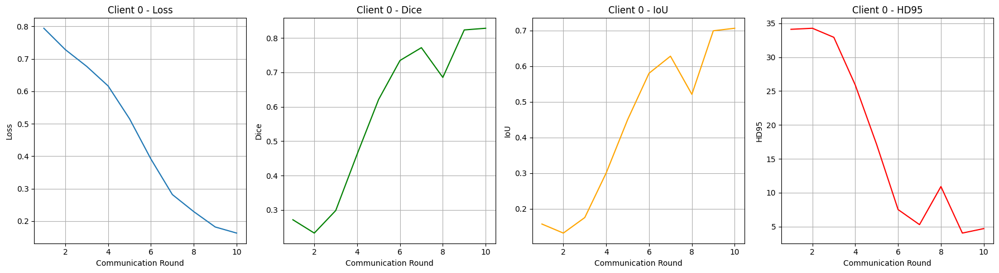

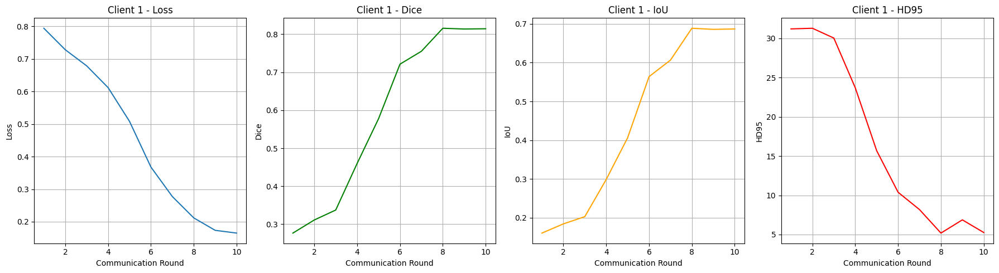

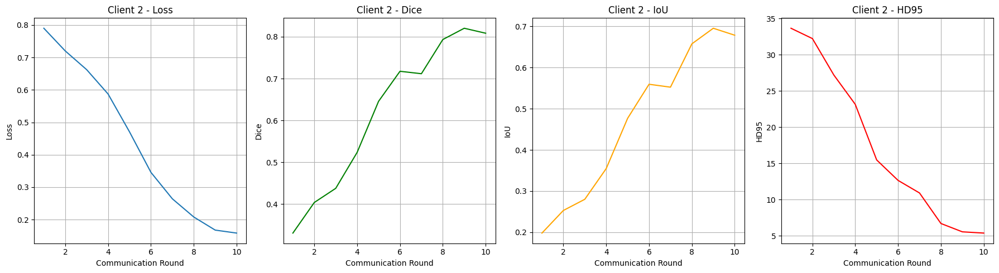

In [ ]:
#local clients per communication round

for client_id, metrics in client_history.items():

    rounds = range(1, len(metrics["dice"]) + 1)

    plt.figure(figsize=(18, 5))

    # ----------------------------
    # Loss
    # ----------------------------
    plt.subplot(1, 4, 1)
    plt.plot(rounds, metrics["loss"])
    plt.xlabel("Communication Round")
    plt.ylabel("Loss")
    plt.title(f"Client {client_id} - Loss")
    plt.grid(True)

    # ----------------------------
    # Dice
    # ----------------------------
    plt.subplot(1, 4, 2)
    plt.plot(rounds, metrics["dice"], color="green")
    plt.xlabel("Communication Round")
    plt.ylabel("Dice")
    plt.title(f"Client {client_id} - Dice")
    plt.grid(True)

    # ----------------------------
    # IoU
    # ----------------------------
    plt.subplot(1, 4, 3)
    plt.plot(rounds, metrics["iou"], color="orange")
    plt.xlabel("Communication Round")
    plt.ylabel("IoU")
    plt.title(f"Client {client_id} - IoU")
    plt.grid(True)

    # ----------------------------
    # HD95
    # ----------------------------
    plt.subplot(1, 4, 4)
    plt.plot(rounds, metrics["hd95"], color="red")
    plt.xlabel("Communication Round")
    plt.ylabel("HD95")
    plt.title(f"Client {client_id} - HD95")
    plt.grid(True)

    plt.tight_layout()
    plt.show()

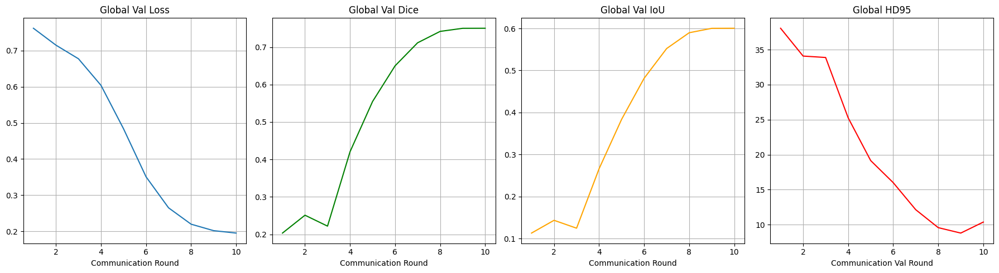

In [ ]:
# Global Model per Communication Round
rounds = range(1, len(global_history["dice"]) + 1)

plt.figure(figsize=(18, 5))

plt.subplot(1,4,1)
plt.plot(rounds, global_history["loss"])
plt.xlabel("Communication Round")
plt.title("Global Val Loss")
plt.grid(True)

plt.subplot(1,4,2)
plt.plot(rounds, global_history["dice"], color="green")
plt.xlabel("Communication Round")
plt.title("Global Val Dice")
plt.grid(True)

plt.subplot(1,4,3)
plt.plot(rounds, global_history["iou"], color="orange")
plt.xlabel("Communication Round")
plt.title("Global Val IoU")
plt.grid(True)

plt.subplot(1,4,4)
plt.plot(rounds, global_history["hd95"], color="red")
plt.xlabel("Communication Val Round")
plt.title("Global HD95")
plt.grid(True)

plt.tight_layout()
plt.show()

**Test Set and Segmentation**

In [ ]:
# -----------------------------
# 1️⃣ Load test set
# -----------------------------
test_dwi, test_masks = load_dwi_mask_pairs(os.path.join(data_dir, "test"))

test_dataset = ISLESDataset(
    dwi_files=test_dwi,
    mask_files=test_masks,
    image_transform=sample_transform,
    mask_transform=mask_transform
)

test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)
print("Test samples:", len(test_dataset))

# -----------------------------
# 2️⃣ Load best global model
# -----------------------------
best_model_ckpt = torch.load("best_global_model.pth")
global_model = create_model().to(device)
global_model.load_state_dict(best_model_ckpt["model_state_dict"])
global_model.eval()

# -----------------------------
# 3️⃣ Metrics setup
# -----------------------------
dice_metric = DiceMetric(include_background=False, reduction="mean")
hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

all_dice = []
all_hd95 = []
all_iou = []

from tqdm import tqdm

# -----------------------------
# 4️⃣ Evaluate on test set
# -----------------------------
global_model.eval()
all_dice = []
all_hd95 = []
all_iou = []

with torch.no_grad():
    test_bar = tqdm(test_loader, desc="Testing", leave=True)
    for batch_idx, batch in enumerate(test_bar):
        images = batch["image"].to(device, dtype=torch.float32)
        masks = batch["mask"].to(device, dtype=torch.float32)

        outputs = global_model(images)
        pred_binary = (torch.sigmoid(outputs) > 0.5).float()

        # Metrics
        dice_metric(pred_binary, masks)
        hd_metric(pred_binary, masks)

        # Optional: show running metrics in tqdm
        running_dice = dice_metric.aggregate().item()
        running_hd = hd_metric.aggregate().item()
        running_iou = running_dice / (2 - running_dice)
        test_bar.set_postfix({
            "Dice": f"{running_dice:.4f}",
            "IoU": f"{running_iou:.4f}",
            "HD95": f"{running_hd:.4f}"
        })

    # Final metrics
    mean_dice = dice_metric.aggregate().item()
    mean_hd95 = hd_metric.aggregate().item()
    mean_iou = mean_dice / (2 - mean_dice)

    print(f"\nTest Set Metrics:")
    print(f"Dice: {mean_dice:.4f}")
    print(f"IoU: {mean_iou:.4f}")
    print(f"HD95: {mean_hd95:.4f}")

    # Reset metrics for future use
    dice_metric.reset()
    hd_metric.reset()

C:\Users\LAB\AppData\Local\Temp\ipykernel_11768\1367524147.py:19: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  best_model_ckpt = torch.load("best_global_model.pth")


Test samples: 50
SegResNet(
  (act_mod): ReLU(inplace=True)
  (convInit): Convolution(
    (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  )
  (down_layers): ModuleList(
    (0): Sequential(
      (0): Identity()
      (1): ResBlock(
        (norm1): GroupNorm(8, 16, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 16, eps=1e-05, affine=True)
        (act): ReLU(inplace=True)
        (conv1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
        (conv2): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
      )
    )
    (1): Sequential(
      (0): Convolution(
        (conv): Conv3d(16, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1), bias=False)
      )
      (1): ResBlock(
        (norm1): GroupNorm(8, 32, eps=1e-05, affine=True)
        (norm2): GroupNorm(8,

Testing:  52%|█████▏    | 26/50 [00:01<00:01, 13.59it/s, Dice=0.6932, IoU=0.5305, HD95=8.4128] c:\Users\LAB\AppData\Local\Programs\Python\Python310\lib\site-packages\monai\metrics\utils.py:332: UserWarning: the prediction of class 0 is all 0, this may result in nan/inf distance.
  warnings.warn(
Testing:  52%|█████▏    | 26/50 [00:02<00:01, 13.59it/s, Dice=0.6675, IoU=0.5010, HD95=8.4128]c:\Users\LAB\AppData\Local\Programs\Python\Python310\lib\site-packages\monai\metrics\utils.py:327: UserWarning: the ground truth of class 0 is all 0, this may result in nan/inf distance.
  warnings.warn(
Testing: 100%|██████████| 50/50 [00:03<00:00, 13.62it/s, Dice=0.7196, IoU=0.5620, HD95=6.6449]


Test Set Metrics:
Dice: 0.7196
IoU: 0.5620
HD95: 6.6449


**Visualize**

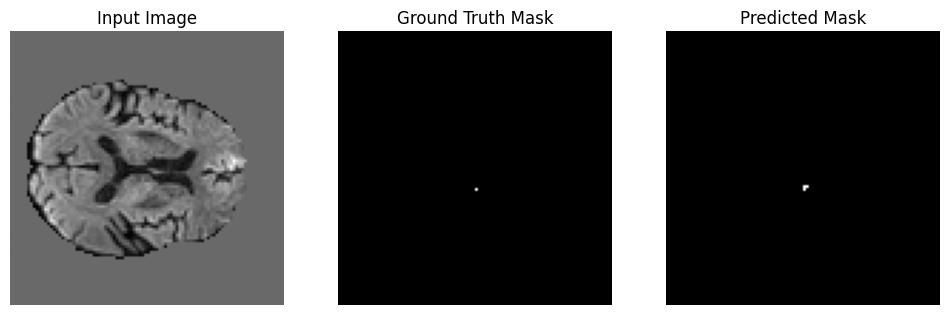

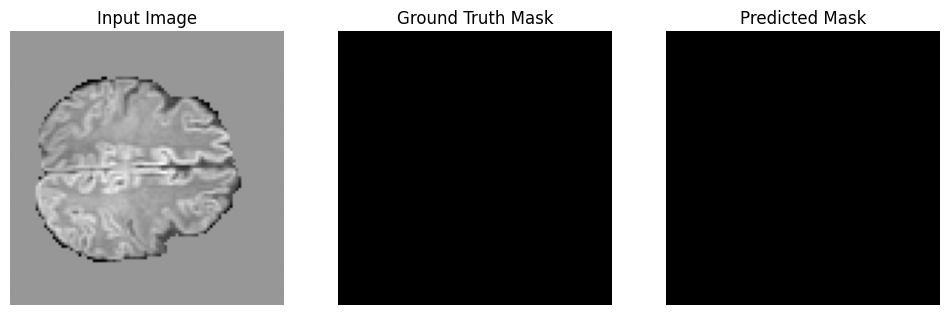

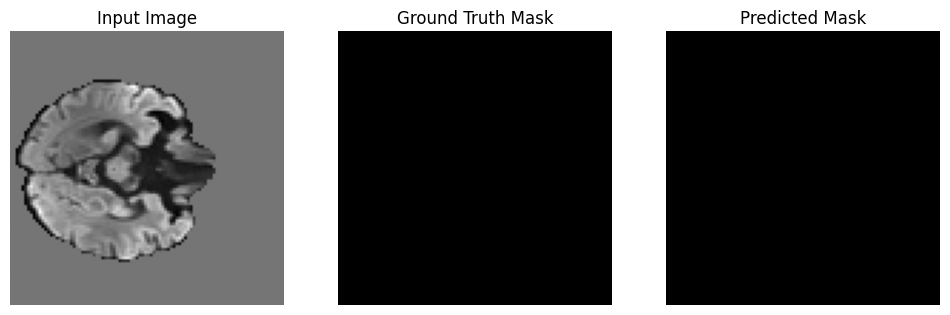

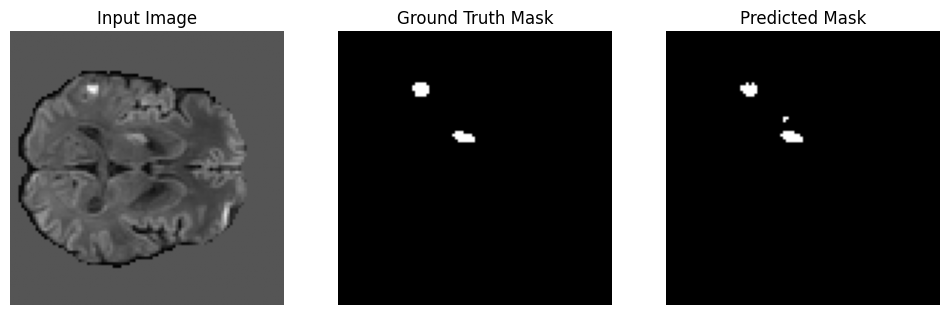

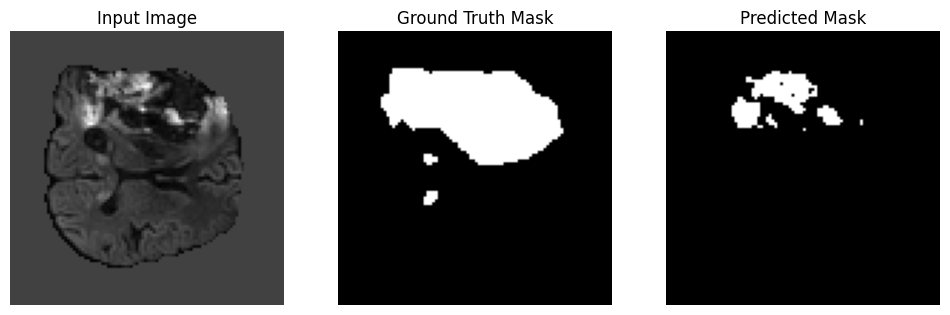

...

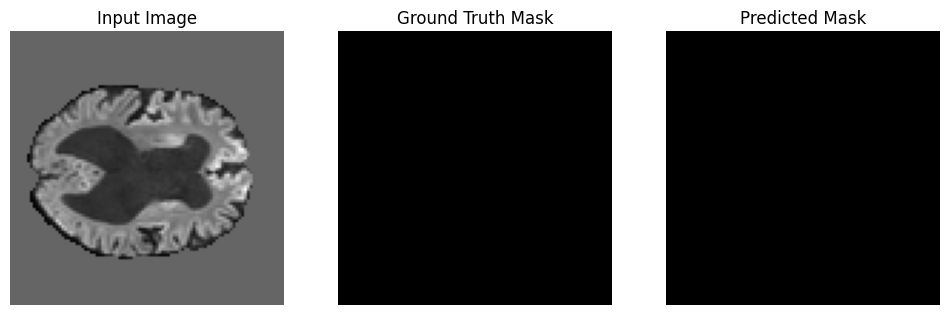

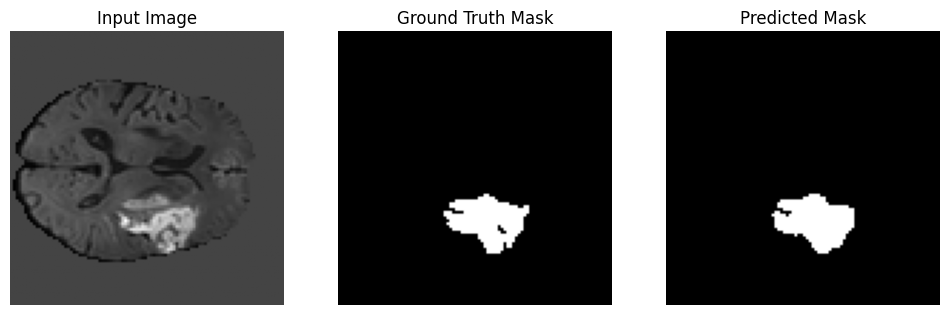

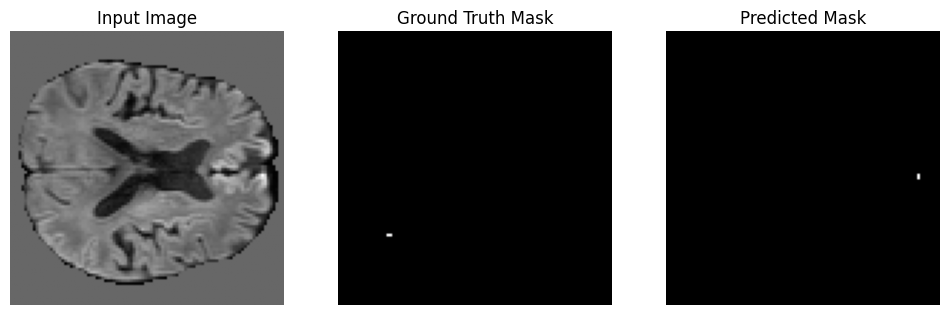

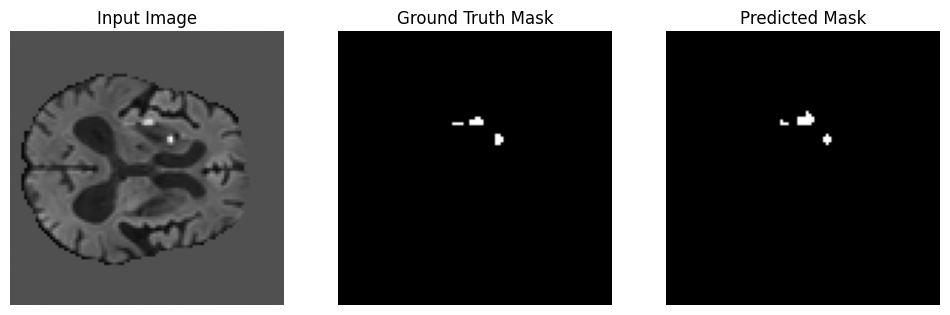

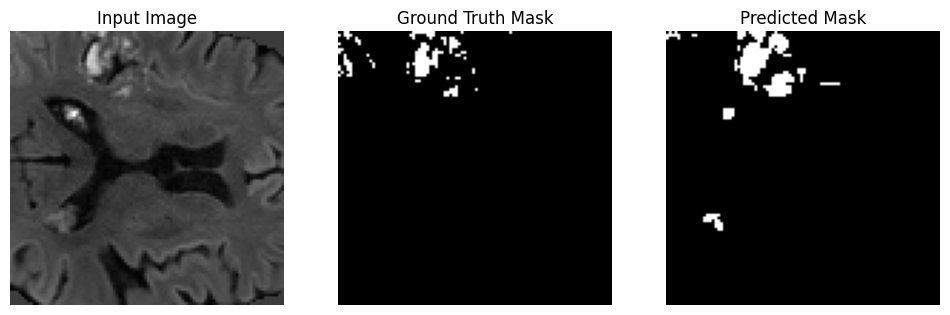

In [ ]:
num_visualize = len(test_dataset)

global_model.eval()

for i in range(num_visualize):
    sample = test_dataset[i]

    # Get tensors
    image_tensor = sample["image"].unsqueeze(0).to(device, dtype=torch.float32)
    mask_tensor  = sample["mask"]

    # Convert for visualization
    image = sample["image"][0].cpu().numpy()
    mask  = sample["mask"][0].cpu().numpy()

    # Predict
    with torch.no_grad():
        output = global_model(image_tensor)
        pred = (torch.sigmoid(output)[0, 0].cpu().numpy() > 0.5).astype(float)

    # Middle slice
    mid_slice = image.shape[2] // 2
    img_slice  = image[:, :, mid_slice]
    mask_slice = mask[:, :, mid_slice]
    pred_slice = pred[:, :, mid_slice]

    # Plot
    plt.figure(figsize=(12,4))

    plt.subplot(1,3,1)
    plt.imshow(img_slice, cmap="gray")
    plt.title("Input Image")
    plt.axis("off")

    plt.subplot(1,3,2)
    plt.imshow(mask_slice, cmap="gray")
    plt.title("Ground Truth Mask")
    plt.axis("off")

    plt.subplot(1,3,3)
    plt.imshow(pred_slice, cmap="gray")
    plt.title("Predicted Mask")
    plt.axis("off")

    plt.show()